# Modeling with NeuroPAL Data:
(written by Amanda Ray for the publication "Nonlinear integration of sensory inputs and behavioral state by a single neuron in C. elegans" doi: https://doi.org/10.1101/2025.04.05.647390) 

Written: 10.13.25, last updated: 10.16.25


This code will walk through how we model AIB activity using NeuroPAL data from Yemini et al., Cell 2021. (doi: https://doi.org/10.1016/j.cell.2020.12.012)

Dataset was obtained from their website: https://www.yeminilab.com/neuropal

A README file is provided with their dataset, and was used for guidance. Please familiarize yourself with their dataset and their README to better understand the data structures and why I processed data the way I did.

This code will walk through how data was processed, and applied to all of our models (AVA-only, summation, and derivative). Please note that you should look through the other respective notebooks provided with 'Modeling Neuron Data' in the name to familiarize yourself with the methods used. This notebook will basically combine and apply everything from those notebooks.

Note: in the NeuroPAL dataset, there are traces missing here and there, and there are uneven dataset lengths, or datasets with nans padded randomly. A lot of the processing and modeling has to work around these caveats, so I have to include a lot of loop statements to resolve these issues. I use a lot of 'try-except' loops to help, and np.nanmean or np.nanmedian etc for calculations.


** Please note that I am an amateur at coding. I'm sure there are more efficient ways to code things, so please feel free to rewrite code more proficiently for your own usage! :) **

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math
import numpy as np
from scipy.optimize import minimize

In [10]:
# There are 3 datasets provided (explained in comments below), I only use the first dataset though

import scipy.io

# change to your pathname :) 
pathname = '/Users/lotus/Desktop/Python/NeuroPAL data/Whole-Brain Calcium Activity/Young Adults/'

mat1 = scipy.io.loadmat(pathname + 'Head_Activity_OH16230.mat')
# 21 Heads, healthier than other strain 
worm_num = 21

mat2 = scipy.io.loadmat(pathname + 'Head_Activity_OH15500.mat')
# 7 Heads

mat3 = scipy.io.loadmat(pathname + 'Tail_Activity_OH16230.mat')
# 21 Tails

# Note, they have different frames per seconds. I only use mat1 so I don't need to adjust between
# datasets. You can find out frames per second by: dataset['fps'] - for mat1, it's 4fps

/var/folders/h2/nr_g6r3s37v0y4h9l4yjz0bw0000gn/T/ipykernel_44610/1946780868.py:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(15,10), facecolor='w')


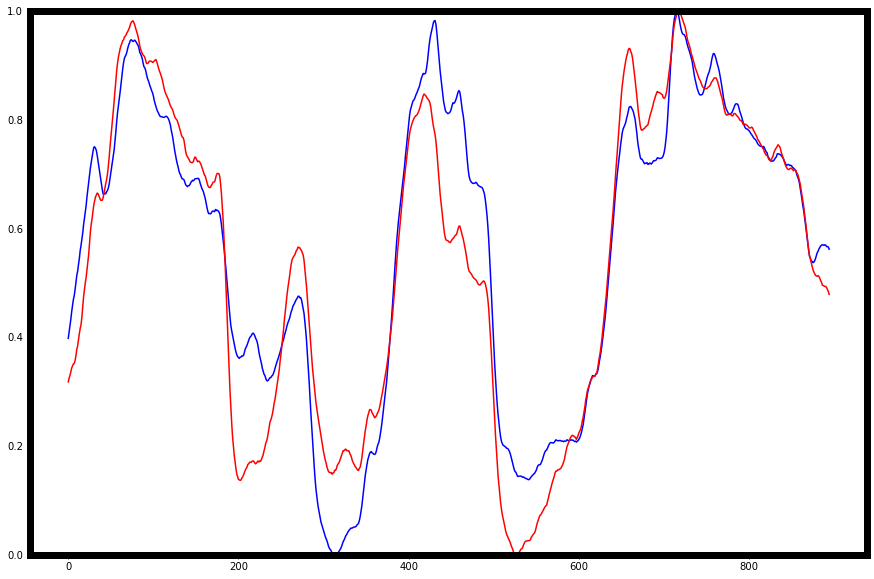

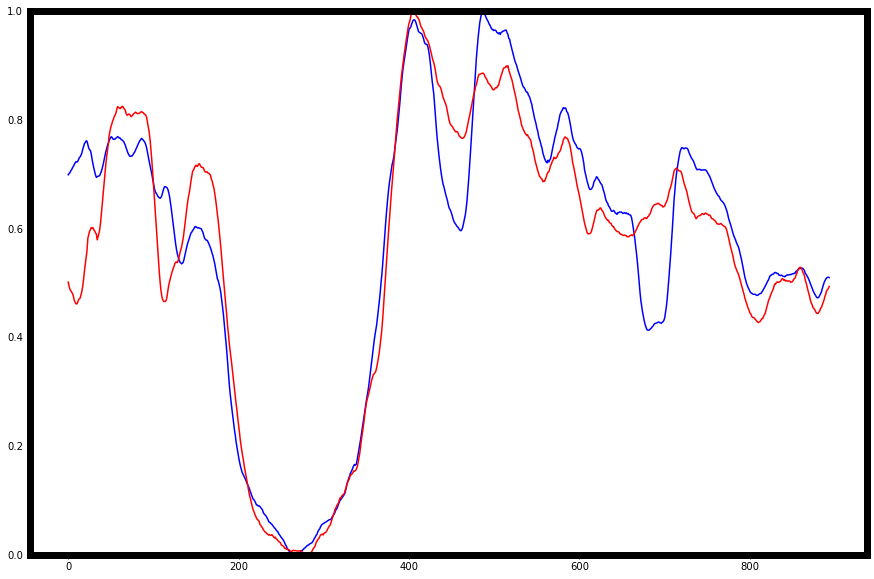

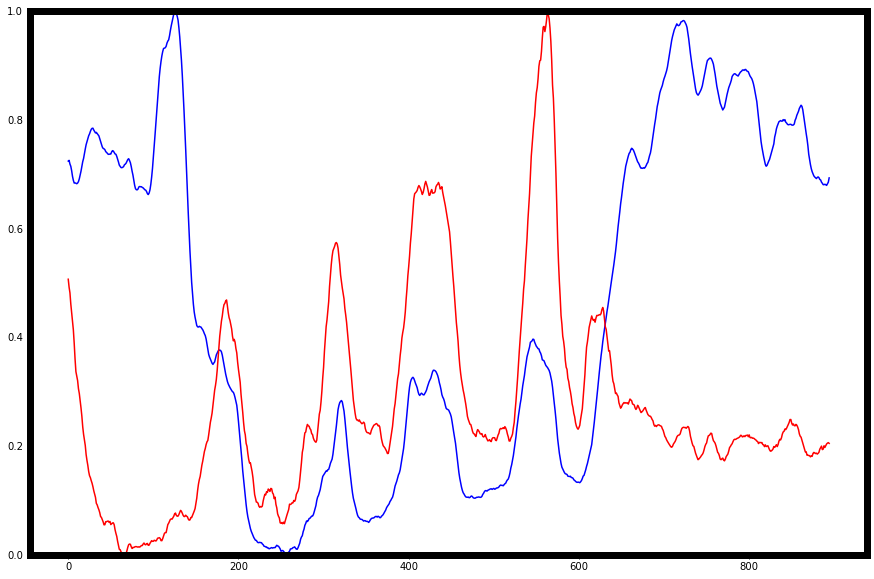

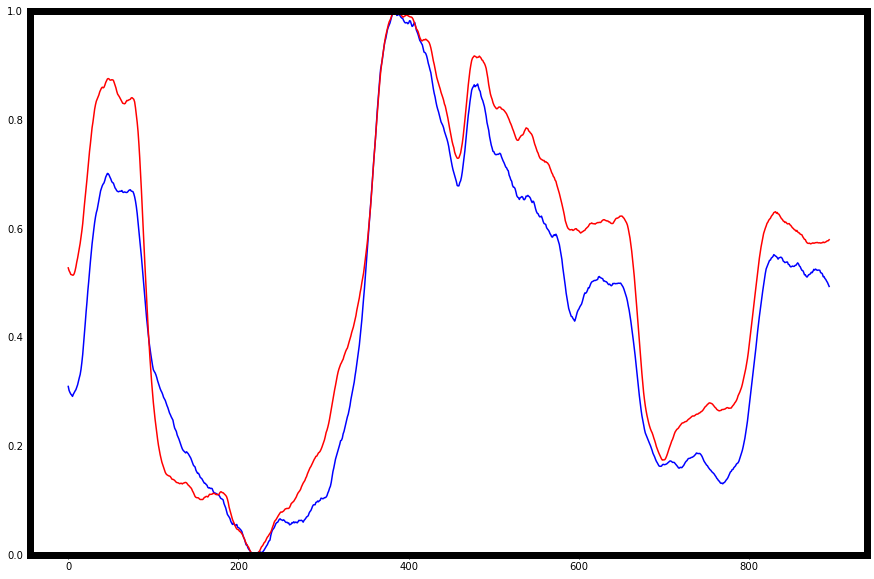

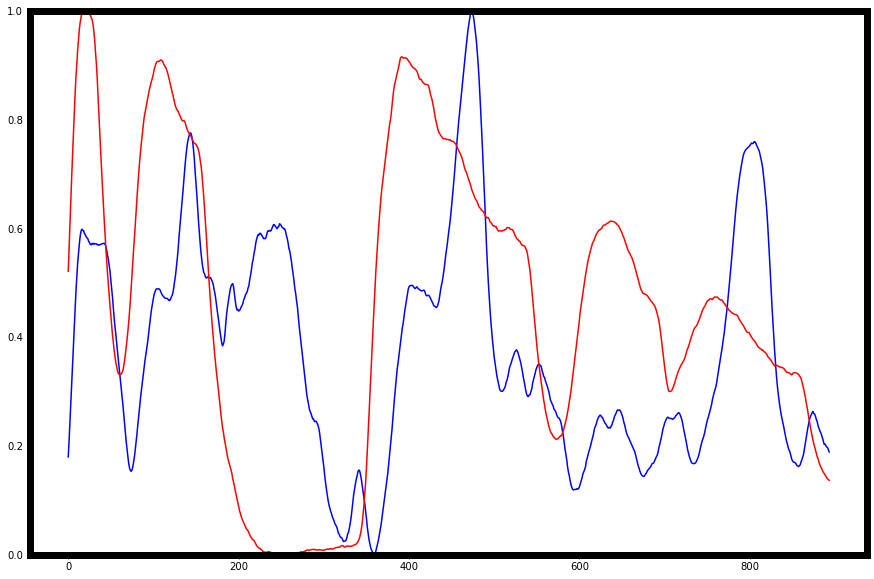

...

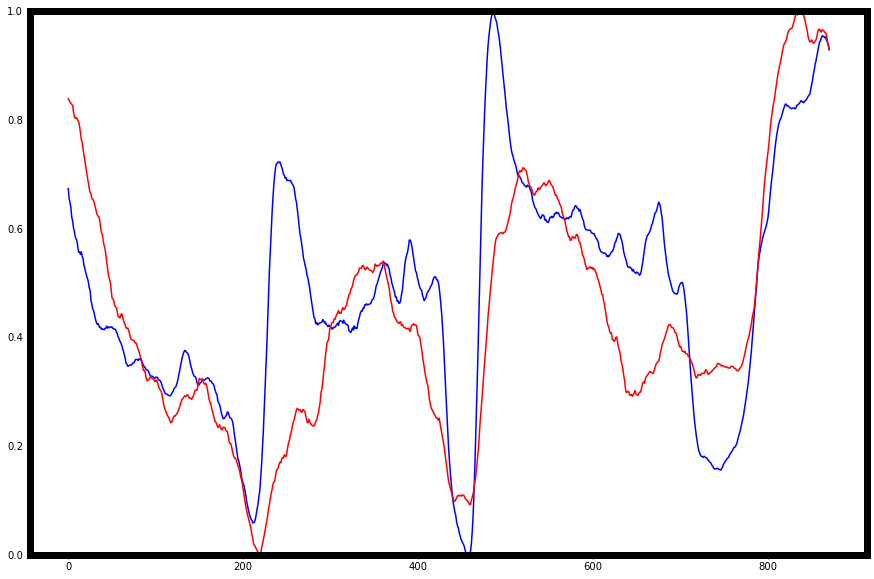

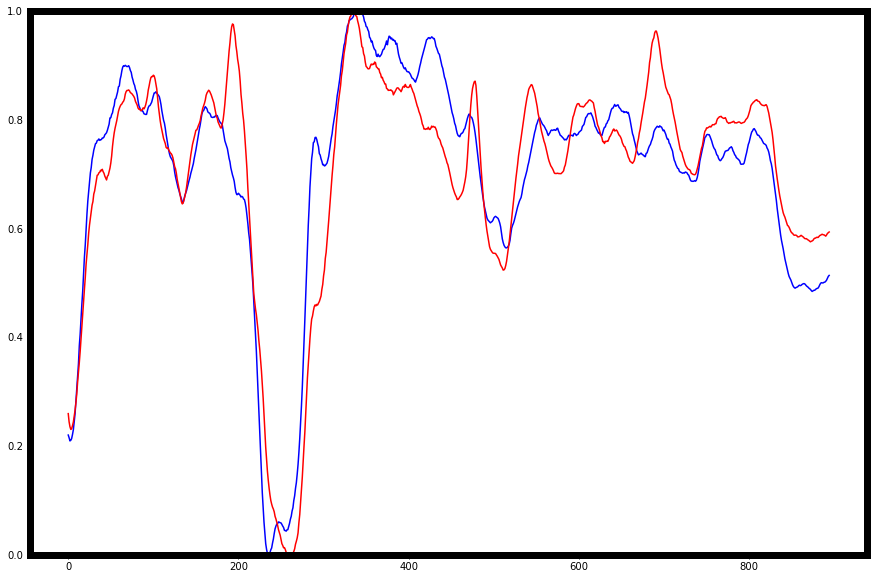

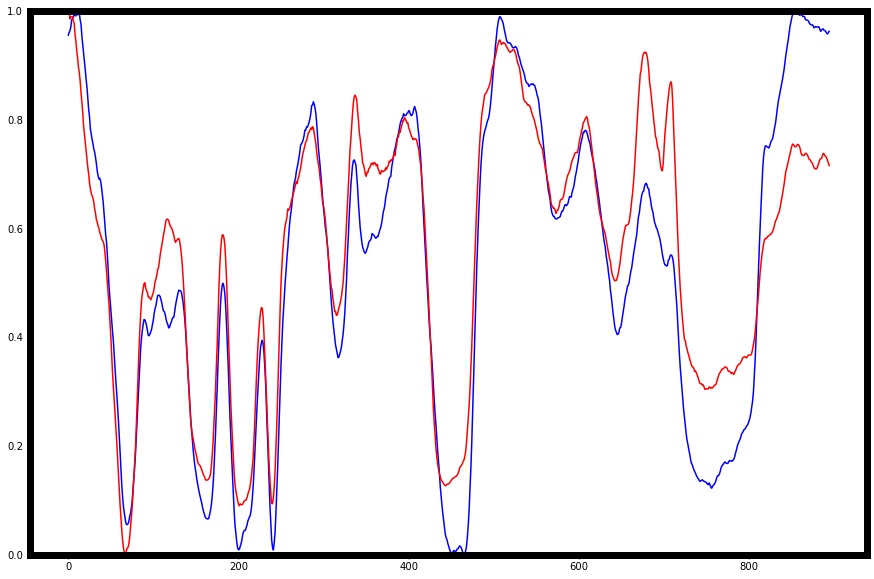

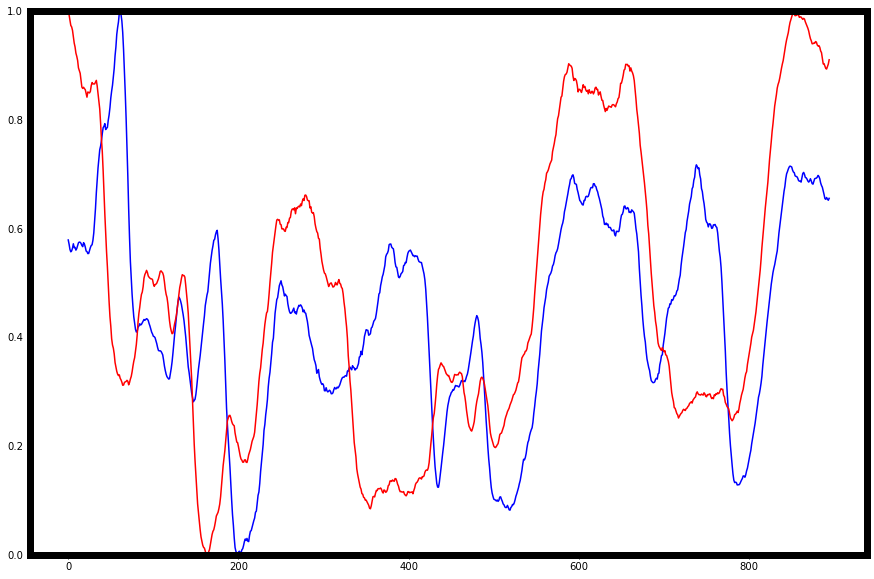

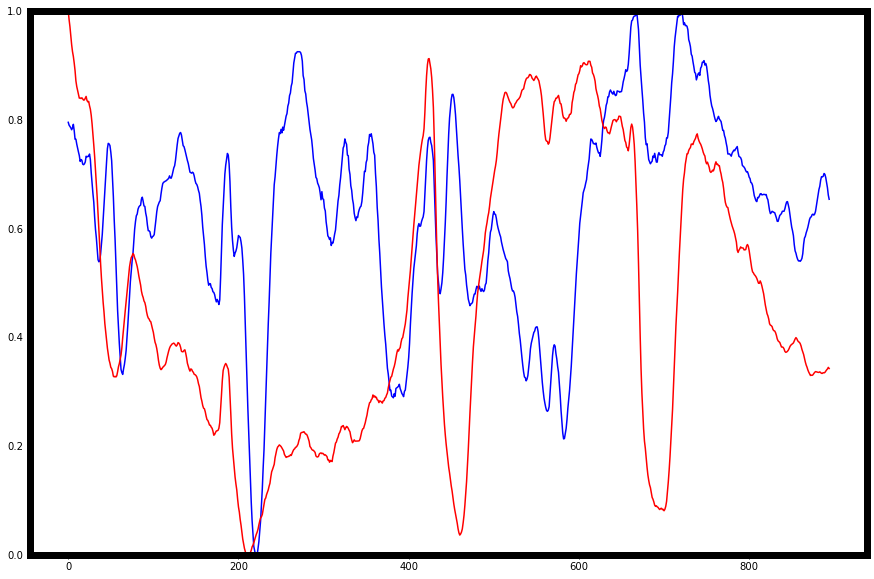

In [30]:
## Need to smooth and normalize data for modeling. Then, look for AIB traces. ##

# There are left and right neuron traces for most neurons in the dataset, 
# so we want to pull out both of them if available 


# Smooth first 

def Smooth(array, shift): # want to smooth data to reduce noise and jitter, I smooth by 5 frames (same as my data)
    step = (2*shift) + 1
    
    temp = []

    for i in range(0,shift):
        plus = array[(i+1):]
        plus = np.append(plus, [np.nan]*(i+1))

        minus = array[:-(i+1)]
        minus = np.insert(minus, 0, [np.nan]*(i+1))

        temp.append(plus)
        temp.append(minus)     

    temp.append(array)

    avg = np.sum((temp), axis = 0) / step
    avgs = avg[shift:-shift]
    
    return avgs


# Normalize smoothed traces
# Note, their dataset has their own version of normalization, but I want to  normalize from 0 - 1 to 
# match our methods

def Norm(array):

    norms = []
    
    mins = np.nanmin(array)
    maxs = np.nanmax(array)
    
    if mins == np.nan and maxs == np.nan:
        norms.append([np.nan]*len(array))
    else:
        for i in array:
            norm = (i - mins)/(maxs - mins)
            norms.append(norm)
    
    return norms


# Search for neurons, and their traces (left and right if applicable)
# Note, you need to kind of know ahead of time whether a neuron has a left/right side, or neither
# I use wormatlas to find out before searching

def LR_Traces(array, searchterm, left_right): #enter neuron search of interest, and side of interest
    
    neuron_number = []
    
    for i in range(0, len(array['neurons'])):
        if searchterm in array['neurons'][i]:
            neuron_number = i
            #print(neuron_number)
    
    if neuron_number == []:
        return 'Error: not found :( '
        # not all worm neurons are present in this dataset - there's 231 out of a total of 302 neurons
    
    traces = array['traces'][neuron_number][0][0]

    L = []
    R = []
    nans = [] # if a neuron doesn't have a left or ride side, it gets saved here

    is_L = array['is_L'][neuron_number][0][0] # checks if neuron is left in neuroPAL
    # data is organized such that a neuron with a left designation has the number 1, right is 0, neither is nan
    # There are 21 worms, so if a neuron has left and right recordings, it actually has 42 arrays

    for i in range(0,len(is_L)):
            trace = traces[i][0][54:-1] #[4:-1] to cut off NaNs, 50 to cut off initial burst that is present
            #(0:(length(traces{neuron}{file})-1))/fps to get the corresponding time in seconds
            if is_L[i] == 1: # left neurons
                try:
                    smoothed = Smooth(trace, 5) # smooth by 5 frames to reduce jitter/noise
                    normalized = Norm(smoothed) # normalize
                    diff_len = 895 - len(normalized) # traces have uneven lengths, want to standardize to same len
                    # chose 895 cuz longest len is 960 - [54:-1] - smoothed (5+5 = 10)
                    L.append(normalized + ([np.nan]*diff_len)) # pad difference in len with nans
                except:
                    L.append([np.nan]*895) # some traces are missing, append nans instead
            if is_L[i] == 0: # right neurons
                try:
                    smoothed = Smooth(trace, 5)
                    normalized = Norm(smoothed)
                    diff_len = 895 - len(normalized)
                    R.append(normalized + ([np.nan]*diff_len))
                except:
                    R.append([np.nan]*895)
            if math.isnan(is_L[i]): # neuron that doesn't have left or right side has nan for is_L
                try:
                    smoothed = Smooth(trace, 5)
                    normalized = Norm(smoothed)
                    diff_len = 895 - len(normalized)
                    nans.append(normalized + ([np.nan]*diff_len))
                except:
                    nans.append([np.nan]*895)
    
    if left_right == 'left':
        return L
    if left_right == 'right':
        return R
    if left_right == 'neither':
        return nans
    
AIB_L = LR_Traces(mat1, 'AIB', 'left')
AIB_R = LR_Traces(mat1, 'AIB', 'right')

# Want to plot just to confirm it was successful
for i in range(worm_num):
    fig, ax = plt.subplots(1,1, figsize=(15,10), facecolor='w') 
    ax.plot(AIB_L[i], color='blue')
    ax.plot(AIB_R[i], color='red')
    ax.set_ylim([0,1])


In [6]:
## Pull out other neuron data ##

# NOTE: These are top ranking neurons presynaptic to AIB. This was determined based on their correlation values.
# Please refer to 'NeuroPAL Correlation Rankings.ipynb' notebook for how neurons were selected.


## NOTE: AWC has to be processed differently, because it's designated as OFF or ON instead of Left or Right
AWC_L = LR_Traces(mat1, 'AWC', 'left') # AWC is organized as left and right first, then it checks below for OFF/ON
AWC_R = LR_Traces(mat1, 'AWC', 'right')

# Here I want to pull out AWC ON and OFF
# from Readme: is_AWCL_OFF = for each file (a), was AWCL stochastically assigned to be AWC-OFF? 
# (otherwise, AWCR is OFF)

AWC_OFF = [] # to properly sort them
AWC_ON = []

for i in range(worm_num):
    if mat1['is_AWCL_OFF'][i][0] == 1: # if equals one, then AWCL = AWC_OFF
        AWC_OFF.append(AWC_L[i])
        AWC_ON.append(AWC_R[i])
    else:
        AWC_OFF.append(AWC_R[i]) # otherwise, AWCR = AWC_OFF
        AWC_ON.append(AWC_L[i])
        
# Other sensory neurons - again, determined based on correlations in 'NeuroPAL Correlation Rankings.ipynb' notebook

ASG_L = LR_Traces(mat1, 'ASG', 'left')
ASG_R = LR_Traces(mat1, 'ASG', 'right')

ADF_L = LR_Traces(mat1, 'ADF', 'left')
ADF_R = LR_Traces(mat1, 'ADF', 'right')

AFD_L = LR_Traces(mat1, 'AFD', 'left')
AFD_R = LR_Traces(mat1, 'AFD', 'right')

ASH_L = LR_Traces(mat1, 'ASH', 'left')
ASH_R = LR_Traces(mat1, 'ASH', 'right')

FLP_L = LR_Traces(mat1, 'FLP', 'left')
# note this is a low-correlation neuron for comparison
# also note that only the left side of FLP synapses onto AIB


# Also want AIA for mirroring our methods with our AVA-AWC-AIA network

AIA_L = LR_Traces(mat1, 'AIA', 'left')
AIA_R = LR_Traces(mat1, 'AIA', 'right')

# Want RIM and AVA for reversal-driven input (will call motor input for short)

RIM_L = LR_Traces(mat1, 'RIM', 'left')
RIM_R = LR_Traces(mat1, 'RIM', 'right')

AVA_L = LR_Traces(mat1, 'AVA', 'left')
AVA_R = LR_Traces(mat1, 'AVA', 'right')

print('Neuron data acquired')

Neuron data acquired


In [9]:
## Averaging traces to combine L and R based on correlation value of their activities ##

# This was done to minimize redundant parameters (ie if L-R sides had similar activities) to reduce 
# over-fitting for modeling. This was also useful too because sometimes a neuron may only have data for one
# side but not the other, so by combining them we can at least have representative data for that 
# neuron for a trial if one side was missing but not the other.

import numpy.ma as ma

def CombineLR(name, left, right, override):
    #first find out how well correlated left-right pairs are
    corrs = []
    for i in range(worm_num):
        try:
            corrs.append(ma.corrcoef(ma.masked_invalid(left[i]), ma.masked_invalid(right[i]))[0][1])
        except:
            corrs.append(np.nan) # if a trace is missing, put nan
            
    med_corrs = np.nanmedian(corrs) # take median of correlations for ranking
    
    both = []
    for j in range(worm_num): 
        both.append(np.nanmean([left[j], right[j]], axis=0))
        
    print("Correlation value of", name, ":", med_corrs)

    #if correlation is high enough, then return combined array
    if med_corrs >= 0.75: # I picked 0.75 correlation value arbitrarily, feel free to change
        print(name + ' combined!')
        return both
    
    elif override == 'yes':
        print('OVERRIDE: '+ name + ' L/R pairs not highly correlated: ' + str(med_corrs))
        # I only use this for AIA; I combine AIA L/R because many trials are missing for one side
        # and they usually have correlated activities. They only appear to have 
        # low correlation here because of the missing sides. So I force them to be combined.
        return both
    
    else:
        print(name + ' L/R pairs not highly correlated: ' + str(med_corrs))
        
# Combining

AIB_both = CombineLR('AIB', AIB_L, AIB_R, 'no')

AWC_both = CombineLR('AWC', AWC_OFF, AWC_ON, 'no') 
AIA_both = CombineLR('AIA', AIA_L, AIA_R, 'yes') 
# I overrode AIA combination cuz a lot of traces had only one AIA side, and they were usually somewhat similar

ASG_both = CombineLR('ASG', ASG_L, ASG_R, 'no')
ADF_both = CombineLR('ADF', ADF_L, ADF_R, 'no')
AFD_both = CombineLR('AFD', AFD_L, AFD_R, 'no')
ASH_both = CombineLR('ASH', ASH_L, ASH_R, 'no')

AVA_both = CombineLR('AVA', AVA_L, AVA_R, 'no')
RIM_both = CombineLR('RIM', RIM_L, RIM_R, 'no')

# FLPL doesn't need to be combined because it's just one side

# Running this block will reveal AWC, ASG, and ADF L/R pairs are not highly correlated and have different activities
# For these neurons, we keep them separate for modeling.


/var/folders/h2/nr_g6r3s37v0y4h9l4yjz0bw0000gn/T/ipykernel_44610/3618215079.py:20: RuntimeWarning: Mean of empty slice
  both.append(np.nanmean([left[j], right[j]], axis=0))


Correlation value of AIB : 0.8431899619456331
AIB combined!
Correlation value of AWC : 0.36359317960649834
AWC L/R pairs not highly correlated: 0.36359317960649834
Correlation value of AIA : 0.5961959844468332
OVERRIDE: AIA L/R pairs not highly correlated: 0.5961959844468332
Correlation value of ASG : 0.31400254550891754
ASG L/R pairs not highly correlated: 0.31400254550891754
Correlation value of ADF : 0.6429320804357008
ADF L/R pairs not highly correlated: 0.6429320804357008
Correlation value of AFD : 0.8224526578624768
AFD combined!
Correlation value of ASH : 0.7984957530718195
ASH combined!
Correlation value of AVA : 0.9726424411489352
AVA combined!
Correlation value of RIM : 0.9659578079079424
RIM combined!


In [290]:
# Single Neuron Convolution Model # 

# This is basically the same as 'Modeling Neuron Data - Single Neuron Convolution.ipynb' notebook
# I modified some things based on their frame rate and the length of their data, and to accomodate nans or 
# missing traces

def Convolution_One(AIB, neuron, params, refit, refit1, refit2, worm_number):
    time = 100 
    # make same time as my data (25 second kernel) 
    # for my data = 250 frames (10fps) 
    # for this data = 100 frames (4fps)
    t = np.arange(0, time) 
    
    models = [] 
    amps = []
    alpha1 = []
    alpha2 = []
    res = [] 
    
    def Model(neuron, addon, params): # one trace has less frames, so I add some padding (addon)
        if refit == 'yes': # if you want to refit model using median alpha values
            k = params[0] * (np.exp(-refit1*t) - np.exp(-refit2*t))
        else:
            k = params[0] * (np.exp(-params[1]*t) - np.exp(-params[2]*t))
        
        model = np.convolve(neuron[:890-addon], k,'valid') 
        # 895 is the longest length of data, after subtracting normalization in beginning in previous block
        # but I also cut off 5 extra frames at the end because some of them have nans at the end, which makes
        # the convolution models have weird artifacts at the end
        return model
        
    for i in range(worm_number):
        #print(i) # uncomment to print progress
        if i == 16: # I found out that worm #16 has 20 less frames than other worms
            add_on = 20 # pad this worm specifically with 20 extra nans
        else:
            add_on = 0
            
        def Res(params):
            model = Model(neuron[i], add_on, params)
            
            short = time - 1 # this is convolution loss from np.convolve ('valid' method) based on kernel length
            
            if math.isnan(neuron[i][0]) == True: # some worms have missing traces; if it's missing, it will be nans
                # make this residual nan to reflect that it's missing (to avoid artificial residuals)
                Residual = np.nan
            else:
                rem = np.subtract(AIB[i][short:890-add_on],model) 
                res = np.nansum(rem**2)
                Residual = res/len(model)
            
            return Residual
        

        optimize = minimize(Res, params, method='Nelder-Mead')
        res.append(optimize['fun'])
        parameters_new = optimize['x']
        new_model = Model(neuron[i], add_on, parameters_new)
        if refit == 'no' and math.isnan(neuron[i][0]) == False:
            alpha1.append(parameters_new[1])
            alpha2.append(parameters_new[2])
        else:
            alpha1.append(np.nan) # if trace is missing, fill alphas with nans to reflect that
            alpha2.append(np.nan)
        models.append(new_model)
        if math.isnan(neuron[i][0]) == True: # if trace is missing, fill amps with nans to reflect that
            amps.append(np.nan)
        else:
            amps.append(parameters_new[0])
        
    return res, models, amps, alpha1, alpha2

p_1 = [1, 0.01, 0.06] # same seed as my dataset

# I put 'blank' since I'm not refitting the alphas here and letting it all float
AVA_only = Convolution_One(AIB_both, AVA_both, p_1, 'no', 'blank', 'blank', worm_num)
AVA_res = AVA_only[0]
AVA_model = AVA_only[1]
AVA_amps = AVA_only[2]
AVA_alpha1 = AVA_only[3]
AVA_alpha2 = AVA_only[4]

med_AVA_amps = np.nanmedian(AVA_amps)
med_AVA_alpha1 = np.nanmedian(AVA_alpha1)
med_AVA_alpha2 = np.nanmedian(AVA_alpha2)

# NOTE: trace #12 is missing for RIM.
RIM_only = Convolution_One(AIB_both, RIM_both, p_1, 'no', 'blank', 'blank', worm_num)
RIM_res = RIM_only[0]
RIM_model = RIM_only[1]
RIM_amps = RIM_only[2]
RIM_alpha1 = RIM_only[3]
RIM_alpha2 = RIM_only[4]

med_RIM_amps = np.nanmedian(RIM_amps)
med_RIM_alpha1 = np.nanmedian(RIM_alpha1)
med_RIM_alpha2 = np.nanmedian(RIM_alpha2)

# You can see how similar the median alpha values are between AVA and RIM, and with our dataset. 
# Because of this, I just use med_AVA_alpha1 or 2 throughout code for simplicity, instead of flip-flopping 
# between AVA and RIM alphas. Feel free to change it to median RIM alphas if you want.
print('Median AVA alpha1:', med_AVA_alpha1)
print('Median AVA alpha2:', med_AVA_alpha2)
print('Median RIM alpha1:', med_RIM_alpha1)
print('Median RIM alpha2:', med_RIM_alpha2)


# There are some strange outliers that happen during fitting of the kernels
# (the trace doesn't look quite like normal AVA activity, and is missing for RIM)
# This isn't necessary to fix for subsequent modeling, but if you want to refit the data by using the 
# same median alpha 1/2 values, it fixes the outliers. You can refit it below if you are curious.

# I took the standard deviation of the AVA alpha 1/2 values excluding the outlier (worm #12)

AVA_only_refit = Convolution_One(AIB_both, AVA_both, p_1, 'yes', med_AVA_alpha1, med_AVA_alpha2, worm_num)

RIM_only_refit = Convolution_One(AIB_both, RIM_both, p_1, 'yes', med_RIM_alpha1, med_RIM_alpha2, worm_num)


print('Single Neuron Convolution: Done')    

Median AVA alpha1: 0.015337711142397084
Median AVA alpha2: 0.07230137256711444
Median RIM alpha1: 0.015346481072518793
Median RIM alpha2: 0.07234164619369644
Single Neuron Convolution: Done


         AVA        RIM
0   0.022294   0.088710
1   0.025802   0.115763
2   0.018720   0.014474
3   0.026339   0.083227
4   0.020741   0.024628
5   0.023963   0.021698
6   0.027602   0.026953
7   0.030091   0.029177
8   0.023795   0.023388
9   0.021726   0.022524
10  0.024679   0.026041
11  0.027692  42.903457
12  0.008682        NaN
13  0.022510   0.023815
14  0.024101   0.025475
15  0.027529   0.027375
16  0.023183   0.023531
17  0.026930   0.116414
18  0.026670   0.030573
19  0.025123   0.026064
20  0.024735   0.024359
         AVA       RIM
0   0.015375  0.075314
1   0.015345  0.093036
2   0.015487  0.015349
3   0.013810  0.051827
4   0.015382  0.015321
5   0.015342  0.015375
6   0.015485  0.015338
7   0.015192  0.015306
8   0.015337  0.015354
9   0.015374  0.015355
10  0.015321  0.015346
11  0.015326  3.512472
12 -0.006387       NaN
13  0.015373  0.015342
14  0.015335  0.015347
15  0.015330  0.015328
16  0.015356  0.015341
17  0.015332  0.087811
18  0.015338  0.015201
19  0.015352

(0.0, 35.0)

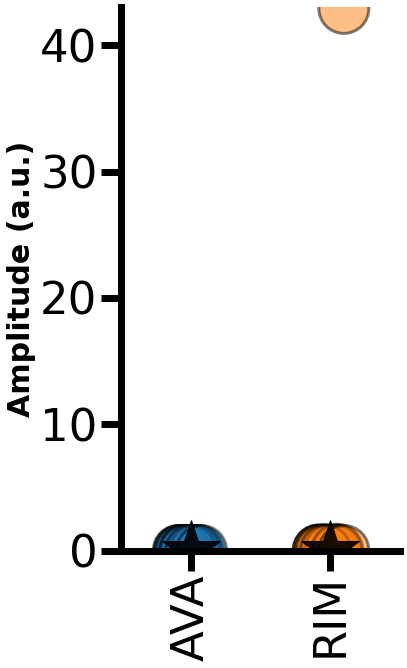

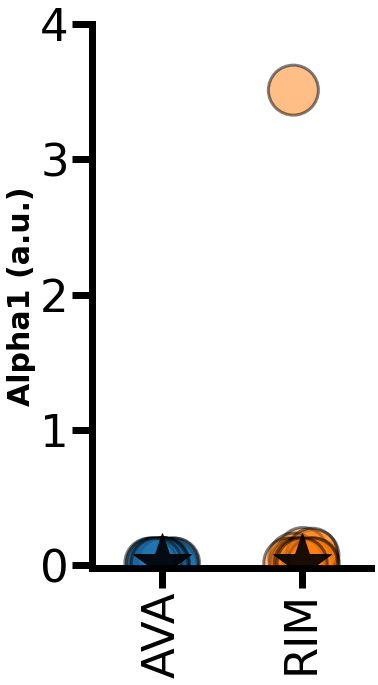

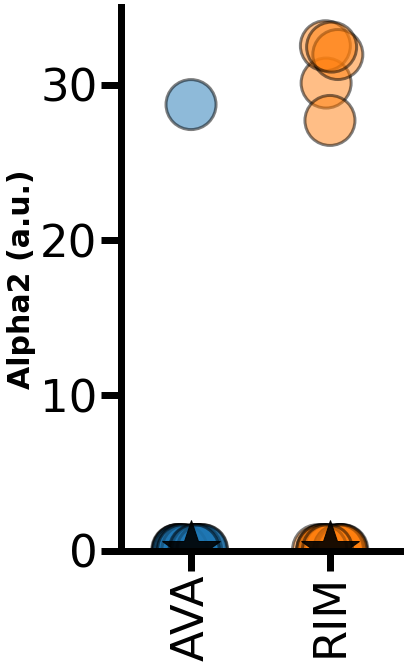

In [294]:
## Plot AVA- and RIM-Only Params ##

# Seaborn (sns) likes using pandas dataframes for plotting 

AVA_RIM_amps = np.concatenate((AVA_amps, RIM_amps))
AVA_RIM_amps = np.reshape(AVA_RIM_amps,(2,21))
AVA_RIM_label = ['AVA', 'RIM']

dF_AVA_RIM_amps = pd.DataFrame(AVA_RIM_amps.T, columns=AVA_RIM_label)
print(dF_AVA_RIM_amps)
    
fig, ax = plt.subplots(1,1, figsize=(5,10), facecolor='w') 
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 7
sns.stripplot(data=dF_AVA_RIM_amps, edgecolor= 'black', linewidth=3, size=50, alpha = 0.5, zorder=1)
ax.plot('AVA', med_AVA_amps, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.plot('RIM', med_RIM_amps, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.set_ylabel('Amplitude (a.u.)', fontsize=30, weight='bold')
ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
plt.xticks(rotation=90)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.set_xlim([-0.5, 1.5])
ax.set_ylim([0,43]) # feel free to change, hard to see
#plt.savefig('AVA- RIM- only amps.svg')

AVA_RIM_alpha1 = np.concatenate((AVA_alpha1, RIM_alpha1))
AVA_RIM_alpha1 = np.reshape(AVA_RIM_alpha1,(2,21))
dF_AVA_RIM_alpha1 = pd.DataFrame(AVA_RIM_alpha1.T, columns=AVA_RIM_label)
print(dF_AVA_RIM_alpha1)

fig, ax = plt.subplots(1,1, figsize=(5,10), facecolor='w') 
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 7
sns.stripplot(data=dF_AVA_RIM_alpha1, edgecolor= 'black', linewidth=3, size=50, alpha = 0.5, zorder=1)
ax.plot('AVA', med_AVA_alpha1, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.plot('RIM', med_RIM_alpha1, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.set_ylabel('Alpha1 (a.u.)', fontsize=30, weight='bold')
ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
plt.xticks(rotation=90)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.set_xlim([-0.5, 1.5])
ax.set_ylim([-0.02,4]) # feel free to change, hard to see
#plt.savefig('AVA- RIM- only alpha1.svg')

AVA_RIM_alpha2 = np.concatenate((AVA_alpha2, RIM_alpha2))
AVA_RIM_alpha2 = np.reshape(AVA_RIM_alpha2,(2,21))
dF_AVA_RIM_alpha2 = pd.DataFrame(AVA_RIM_alpha2.T, columns=AVA_RIM_label)
print(dF_AVA_RIM_alpha2)

fig, ax = plt.subplots(1,1, figsize=(5,10), facecolor='w') 
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 7
sns.stripplot(data=dF_AVA_RIM_alpha2, edgecolor= 'black', linewidth=3, size=50, alpha = 0.5, zorder=1)
ax.plot('AVA', med_AVA_alpha2, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.plot('RIM', med_RIM_alpha2, '*', markersize = 60, c = 'black', alpha = 0.9, zorder=2)
ax.set_ylabel('Alpha2 (a.u.)', fontsize=30, weight='bold')
ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
plt.xticks(rotation=90)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.set_xlim([-0.5, 1.5])
ax.set_ylim([0,35]) # feel free to change, hard to see
#plt.savefig('AVA- RIM- only alpha2.svg')

         AVA       RIM
0   0.074107  0.029194
1   0.057872  0.036810
2   0.043338  0.068825
3   0.044506  0.012724
4   0.020823  0.019322
5   0.034713  0.031506
6   0.024169  0.025788
7   0.013643  0.015118
8   0.067025  0.059891
9   0.030026  0.030405
10  0.051556  0.073693
11  0.093357  0.013828
12  0.068551       NaN
13  0.046227  0.048444
14  0.016905  0.016502
15  0.044864  0.049000
16  0.049180  0.052128
17  0.041727  0.012815
18  0.079058  0.102287
19  0.022932  0.022434
20  0.073592  0.039263


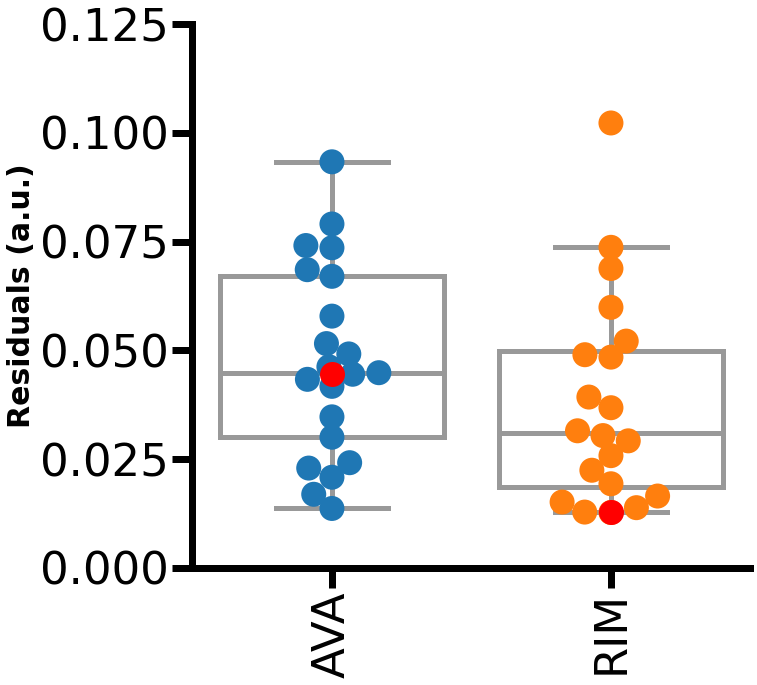

In [295]:
## Compare similarity in AVA- and RIM- only modeling residuals #

AVA_RIM_res = np.concatenate((AVA_res, RIM_res))
AVA_RIM_res = np.reshape(AVA_RIM_res,(2, worm_num))

dF_AVA_RIM_res = pd.DataFrame(AVA_RIM_res.T, columns=AVA_RIM_label)
print(dF_AVA_RIM_res)

colors = sns.color_palette("Pastel1")

fig, ax = plt.subplots(1,1, figsize=(10,10), facecolor='w')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 7
sns.boxplot(data = dF_AVA_RIM_res, color='white', linewidth = 5)
sns.swarmplot(data = dF_AVA_RIM_res, size=25)
sns.swarmplot(data = dF_AVA_RIM_res.loc[[3]], size=25, color='red')
# highlight specific worm #3 shown in paper, note this duplicates data, so I just use to highlight
plt.xticks(rotation=90)
ax.set_ylim([0,0.125]) 
ax.set_ylabel('Residuals (a.u.)', fontsize=30, weight='bold')
ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
#plt.savefig('Residuals - AVA- RIM-only.svg')



In [82]:
# Making Arrays for Summation Modeling #

# Since some neurons have 2 "inputs" (one left and one right side) and some are just 1 "input", 
# there will be some uneven arrays, and is a little annoying to deal with.
# There's probably a better way to do this, but I consolidated (cons_) them here and then use these
# arrays for summation, which loops through given inputs and sums them together

# NOTE: I put the 'reversal' input (AVA or RIM) last, so that I can consistently index the last
# item to get the amp for the derivative model (for dAVA/dt or dRIM/dt)

# These arrays are also used for plotting later

# AVA-AWC-AIA Network
AWC_AIA_AVA_name = ['AWC_OFF','AWC_ON', 'AIA', 'AVA']
AWC_AIA_AVA = np.concatenate((AWC_OFF, AWC_ON, AIA_both, AVA_both))
AWC_AIA_AVA = np.reshape(AWC_AIA_AVA,(len(AWC_AIA_AVA_name), worm_num, 895)) 


# Sensory & RIM
cons_AWC_RIM_name = ['AWC_OFF', 'AWC_ON', 'RIM'] 
cons_AWC_RIM = np.concatenate((AWC_OFF, AWC_ON, RIM_both))
cons_AWC_RIM =  np.reshape(cons_AWC_RIM,(len(cons_AWC_RIM_name), worm_num, 895))

cons_ASG_RIM_name = ['ASGL', 'ASGR', 'RIM'] 
cons_ASG_RIM = np.concatenate((ASG_L, ASG_R, RIM_both))
cons_ASG_RIM =  np.reshape(cons_ASG_RIM,(len(cons_ASG_RIM_name), worm_num, 895))

cons_ADF_RIM_name = ['ADFL', 'ADFR', 'RIM'] 
cons_ADF_RIM = np.concatenate((ADF_L, ADF_R, RIM_both))
cons_ADF_RIM =  np.reshape(cons_ADF_RIM,(len(cons_ADF_RIM_name), worm_num, 895))

cons_AFD_RIM_name = ['AFD', 'RIM'] 
cons_AFD_RIM = np.concatenate((AFD_both, RIM_both))
cons_AFD_RIM =  np.reshape(cons_AFD_RIM,(len(cons_AFD_RIM_name), worm_num, 895))

cons_ASH_RIM_name = ['ASH', 'RIM'] 
cons_ASH_RIM = np.concatenate((ASH_both, RIM_both))
cons_ASH_RIM =  np.reshape(cons_ASH_RIM,(len(cons_ASH_RIM_name), worm_num, 895))


# Low correlation sensory input for comparison 
cons_FLPL_RIM_name = ['FLPL', 'RIM'] 
cons_FLPL_RIM = np.concatenate((FLP_L, RIM_both))
cons_FLPL_RIM =  np.reshape(cons_FLPL_RIM,(len(cons_FLPL_RIM_name), worm_num, 895))

print("Data consolidated")

Data consolidated


In [298]:
## Summation model ##

# The way I found to align neuron data together, especially of different number of inputs 
# (ie one AFD L/R combined input vs AWCOFF and AWCON separated inputs)
# is to basically transpose them to line all data up by worm number 
# (ie all worm 0 data can be summed together)
# We use the length of the neuron names list above to find the number of inputs as reference
# If one trace is missing for one worm, as long as other traces are present, the model can still work 
# and will just sum what is remaining.
# If all traces missing for that worm, however, then model becomes nans.

def Convolution_Summation(AIB, neurons, neuron_names, negative, worm_number):
    time = 100 # to match my kernel length of 25 seconds (4fps here)
    t = np.arange(0, time)
    
    neurons_new = []

    for b in range(worm_number): # this is where we transpose neuron input data to line them up by worm number
        tempn = []
        for c in range(len(neuron_names)):
            tempn.append(neurons[c][b])
        neurons_new.append(tempn)
        
    length = len(neuron_names) # this is our reference for how many inputs we have
    
    amps = []
    for l in range(length): # for however many inputs we have, seed that many amplitude parameters
        if negative == 'yes': # ASH is actually seeded with negative amps, see below for explanation
            amps.append(-med_AVA_amps)
        else:
            amps.append(med_AVA_amps) 
            # just use median AVA amplitude arbitrarily, seems to work well, can try other seeds
    
    models = [] 
    new_amps = []
    res = []
    successes = []
    
    def Model(neurons_n, addon, amps2):
        temp = []
            
        for j in range(length): # for each input, apply this model 
            kernel = amps2[j] * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t)) # notice amps index matches
            conv = np.convolve(neurons_n[j][:890-addon], kernel, 'valid') 
            # 895 is the longest length of data, after subtracting normalization in beginning in previous block
            # but I also cut off 5 extra frames at the end because some of them have nans at the end, which makes
            # the convolution models have weird artifacts at the end
            temp.append(conv) # append convolution to temp array to sum below
        
        # NOTE: if a neuron trace is missing, it will just be nans
        # np.convolve produces nans if input is nan
        model = np.nansum(temp, axis=0) 
        # need to sum them all together, use nansum cuz if trace missing and is nan (can still sum others present)
        # NOTE: if ALL traces missing for that worm, the model becomes nans. 
        return model  
    
    for i in range(worm_number):
        #print(i)
        if i == 16: # found that worm #16 specifically has 20 less frames, pad it to make even with others
            add_on = 20
        else:
            add_on = 0
            
        def Res(amps):
            model = Model(neurons_new[i], add_on, amps)
            short = time - 1 
            
            count = 0 #want to count how many nans there are for below *
            for z in range(length):
                if math.isnan(neurons_new[i][z][0]) == True: 
                    count += 1
                    
            if count == length: 
                Residual = np.nan
                # * if all inputs (which equals length) are nans, that means all traces missing for that worm 
                # sometimes just one trace can be missing for one worm, but can still sum other neurons so it's okay
                # but if all of them are missing, then we want to ignore it
                # put nan to ignore  
            else:
                rem = np.subtract(AIB[i][short:890-add_on],model)
                res = np.nansum(rem**2) 
                Residual = res/len(model)
            return Residual
        
        optimize = minimize(Res, amps, method='Nelder-Mead', options = {'maxiter':3000})
        successes.append(optimize['success'])
        res.append(optimize['fun'])
        parameters_new = optimize['x']
        new_model = Model(neurons_new[i], add_on, parameters_new)
        models.append(new_model)
        for check in range(length):
            if math.isnan(neurons_new[i][check][0]) == True:
                parameters_new[check] = np.nan # if trace is missing make amp nan
        new_amps.append(parameters_new)
    
    ampsT = np.array(new_amps).T # need to transpose for easier access in derivative model
         
    return res, models, ampsT


print('Summing AVA-AWC-AIA network... ')
AWC_AIA_AVA_sum = Convolution_Summation(AIB_both, AWC_AIA_AVA, AWC_AIA_AVA_name, 'no', worm_num)
AWC_AIA_AVA_sum_res = AWC_AIA_AVA_sum[0]
AWC_AIA_AVA_sum_models = AWC_AIA_AVA_sum[1]
AWC_AIA_AVA_sum_amps_T = AWC_AIA_AVA_sum[2]


print('Summing individual sensory + RIM... ')
AWC_RIM_sum = Convolution_Summation(AIB_both, cons_AWC_RIM, cons_AWC_RIM_name, 'no', worm_num)
AWC_RIM_sum_res = AWC_RIM_sum[0]
AWC_RIM_sum_models = AWC_RIM_sum[1]
AWC_RIM_sum_amps_T = AWC_RIM_sum[2]

ADF_RIM_sum = Convolution_Summation(AIB_both, cons_ADF_RIM, cons_ADF_RIM_name, 'no', worm_num)
ADF_RIM_sum_res = ADF_RIM_sum[0]
ADF_RIM_sum_models = ADF_RIM_sum[1]
ADF_RIM_sum_amps_T = ADF_RIM_sum[2]

ASG_RIM_sum = Convolution_Summation(AIB_both, cons_ASG_RIM, cons_ASG_RIM_name, 'no', worm_num)
ASG_RIM_sum_res = ASG_RIM_sum[0]
ASG_RIM_sum_models = ASG_RIM_sum[1]
ASG_RIM_sum_amps_T = ASG_RIM_sum[2]

# ASH was actually seeded with negative amps, because it was thought to be anticorrelated with 
# AIB, however, it's such a minor difference that it's not really necessary.
# I left it as is though to be consistent with what was published, but you can try without 
# the negative seed (replace 'yes' with 'no')
ASH_RIM_sum = Convolution_Summation(AIB_both, cons_ASH_RIM, cons_ASH_RIM_name, 'yes', worm_num)
ASH_RIM_sum_res = ASH_RIM_sum[0]
ASH_RIM_sum_models = ASH_RIM_sum[1]
ASH_RIM_sum_amps_T = ASH_RIM_sum[2]

AFD_RIM_sum = Convolution_Summation(AIB_both, cons_AFD_RIM, cons_AFD_RIM_name, 'no', worm_num)
AFD_RIM_sum_res = AFD_RIM_sum[0]
AFD_RIM_sum_models = AFD_RIM_sum[1]
AFD_RIM_sum_amps_T = AFD_RIM_sum[2]

# low correlation sensory inputs for comparison
FLPL_RIM_sum = Convolution_Summation(AIB_both, cons_FLPL_RIM, cons_FLPL_RIM_name, 'no', worm_num)
FLPL_RIM_sum_res = FLPL_RIM_sum[0]
FLPL_RIM_sum_models = FLPL_RIM_sum[1]
FLPL_RIM_sum_amps_T = FLPL_RIM_sum[2]

print('Done')  


Summing AVA-AWC-AIA network... 
Summing individual sensory + RIM... 
Done


In [65]:
# Take derivative of AVA and RIM - use same shift length (10) as my models before

# If you want to model with multiple motor inputs, make sure to take the derivative of them and combine
# them into one array. Here, I just model with one motor-related input.

def Derivative(array):
    n = 10
    der = []

    for i in array:

        xminus = i[:-n]
        xminus = np.insert(xminus, 0, [np.nan]*(n))

        xplus = i[n:]
        xplus = np.append(xplus, [np.nan]*(n))

        dxdt_temp = (xplus - xminus) / (2*n)
        dxdt_temp2 = dxdt_temp[n:-n]
        der.append(dxdt_temp2)
        
    return der

dAVA = Derivative(AVA_both)
dRIM = Derivative(RIM_both)

print("Derivative taken")

Derivative taken


In [299]:
## Derivative model -- dMotor/dt(sensory) ##

# This model will take sensory inputs (or non-motor inputs, like an interneuro) and fit their amplitudes 
# to the derivative of a motor-related input (like AVA or RIM). This code is a little more complicated 
# than simply summing them, because you have to keep motor and non-motor inputs separate.

# This code is modified so that you can input many motor inputs and many non-motor inputs. Note that I only 
# displayed using RIM/AVA in the paper, and not multiple motor inputs, but feel free to try it with many
# inputs. I've tried multiple motor and non-motor inputs, but they're unpublished. It seems like AIB sums
# reversal-related inputs collectively (they all have highly correlated behavior). We're still not sure how
# AIB handles multiple simultaneous sensory inputs however. It doesn't seem to be summing them, but we haven't
# done extensive modeling on this. To be determined in the future :) 

def Convolution_Dxdt(AIB, non_motor, non_motor_names, motor, motor_names, dmotor, amps_m, worm_number):
    time = 100
    t = np.arange(0, time)
    
    motor_new = [] # I basically transpose the motor inputs if there are multiple inputs given
    for b in range(worm_number):
        tempm = []
        for c in range(len(motor_names)):
            if len(motor_names) == 1: # Otherwise if just one input, don't need to transpose it
                tempm.append(motor[b])
            else:
                tempm.append(motor[c][b])
        motor_new.append(tempm)
        
    non_motor_new = [] # Transpose non-motor inputs (same as summation code above)
    for d in range(worm_number):
        tempn = []
        for e in range(len(non_motor_names)):
            if len(non_motor_names) == 1: # If just one input, don't need to transpose it 
                tempn.append(non_motor[d])
            else:
                tempn.append(non_motor[e][d])
        non_motor_new.append(tempn)
    
    dmotor_mean = np.nanmean(dmotor, axis=0) 
    # if you have just one motor input, this doesn't get used.
    # But, if you use multiple motor inputs, I take the derivative of each of them and put them into an array
    # (beforehand). Then take the average of those derivatives for modeling (my motor inputs were all related to 
    # reversal behavior, so they had highly-correlated activities, which is why taking the averaged derivative
    # was a simplification. This won't work if you have multiple motor inputs with differing activities!)
    
    # if you have multiple motor inputs, need to transpose the provided motor amps for indexing below
    amps_m_T = np.array(amps_m).T 
    
    length = len(non_motor_names) + len(motor_names) # reference for total number of inputs
        
    params = [] #amps and offsets only needed for non-motor inputs; we use the same fixed motor amps from summation
    for a in range(len(non_motor_names)):
        params.append(med_AVA_amps) # decided to keep all the seeds positive, can change to be negative similar
        # to summation model above if you want

    for o in range(len(non_motor_names)): 
        params.append(0.05) # offset seed, I found this to work well, but feel free to try others. 
        #add to end of params for easy indexing
    
    models = [] 
    new_amps = []
    new_offsets = []
    res = []
    successes = []
    
    def Model(non_motor_n, motor_n, dmotor_m, amps_ms, addon, params2):
        amps_s = params2[:len(non_motor_names)] 
        # amp index corresponds to how many inputs given and are at beginning
        offsets = params2[len(non_motor_names):] 
        # same for offsets, but they're at the end
            
        temp = []
        
        # I had to make a ton of conditional statements to deal with 1 or multiple motor or non-motor inputs
        # This was done because the indexing for each condition is different
        # Basically, motor inputs are convolved separately with corresponding motor amplitudes from summation model
        # Then, non-motor (sensory or interneuron) inputs are convolved separately with the motor derivative
        # At the end, sum everything together.
        if len(motor_names) == 1: # simple convolution, no looping
            motor_short = motor_n[10:880-addon] 
            # add 10 extra truncations at beginning and end to align with motor derivative (870 frames)
            kernel_m = amps_ms * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
            conv_m = np.convolve(motor_short,kernel_m, 'valid') 
            temp.append(conv_m)
        else:
            for m in range(len(motor_names)): # need to loop through things if multiple
                motor_short = motor_n[m][10:880-addon]
                kernel_m = amps_ms[m] * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
                conv_m = np.convolve(motor_short,kernel_m, 'valid') 
                temp.append(conv_m)

        if len(non_motor_names) == 1: # simple convolution, no looping
            non_motor_short = non_motor_n[10:880-addon]
            kernel_min = (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
            kernel_s = amps_s * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
            sens_amp = np.convolve(dmotor_m[:870-addon], kernel_s, 'same') + offsets
            # the len of dmotor_m is 870, but if there's a shorter array, need to add extra addon at end
            # don't worry, it's not misaligned with non_motor[10:880] :) 
            conv_s = np.convolve(non_motor_short*sens_amp, kernel_min, 'valid')
            temp.append(conv_s)
        else:
            for s in range(len(non_motor_names)): # need to loop through things if multiple
                non_motor_short = non_motor_n[s][10:880-addon]
                kernel_min = (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
                kernel_s = amps_s[s] * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
                sens_amp = np.convolve(dmotor_m[:870-addon], kernel_s, 'same') + offsets[s]
                conv_s = np.convolve(non_motor_short*sens_amp, kernel_min, 'valid')
                temp.append(conv_s)
        
        # NOTE: if a motor trace is missing, or if all traces for that worm missing, model becomes nans. 
        # np.convolve will produce nans if there is a nan input
        # if one non-motor trace is missing, it can still work as long as motor trace is present, or another
        # non-motor trace is present (will just sum whatever remains)
        model = np.nansum(temp, axis=0) 
        # in the end, sum everything up after each thing is convolved appropriately

        return model

    for i in range(worm_number):
        #print(i)
        if i == 16: # this worm specifically has 20 less frames, so I just pad it
            add_on = 20
        else:
            add_on = 0
            
        def Res(params):
                
            # again, more conditional statements to accomodate single or multiple inputs, and whether things need
            # to be looped through or not
            if len(motor_names) == 1 and len(non_motor_names) > 1:
                model = Model(non_motor_new[i], motor[i], dmotor[i], amps_m[i], add_on, params)
                    
            elif len(motor_names) == 1 and len(non_motor_names) == 1:
                model = Model(non_motor[i], motor[i], dmotor[i], amps_m[i], add_on, params)
                    
            elif len(motor_names) > 1 and len(non_motor_names) == 1:
                model = Model(non_motor[i], motor_new[i], dmotor_mean[i], amps_m_T[i], add_on, params)
                
            else:
                model = Model(non_motor_new[i], motor_new[i], dmotor_mean[i], amps_m_T[i], add_on, params)

                
            if len(motor_names) == 1 and math.isnan(motor[i][0]) == True:
                Residual = np.nan
                # if there's only one motor input, and it has a missing trace (would be nan), then we can't use
                # the dmotor/dt model (because we can't take the derivative of a missing motor input)
                # make the residual a nan to ignore it
            else:
                short = time - 1
                rem = np.subtract(AIB[i][short+10:880-add_on],model)
                res = np.nansum(rem**2)
                Residual = res/len(model)

            return Residual 
        
        optimize = minimize(Res, params, method='Nelder-Mead', options = {'maxiter':3000}) 
        successes.append(optimize['success'])
        res.append(optimize['fun'])
        parameters_new = optimize['x']
        amps_temp = parameters_new[:len(non_motor_names)]
        offsets_temp = parameters_new[len(non_motor_names):]
        
        # a bunch of conditional statements again to accomodate single/multiple inputs for new model,
        # and also want to check if a trace is missing for saving params appropriately (put nan in param if missing)
        if len(motor_names) == 1 and len(non_motor_names) > 1:
            new_model = Model(non_motor_new[i], motor[i], dmotor[i], amps_m[i], add_on, parameters_new)
            for check in range(len(non_motor_names)):
                if math.isnan(non_motor_new[i][check][0]) == True:
                    amps_temp[check] = np.nan
                    offsets_temp[check] = np.nan
        elif len(motor_names) == 1 and len(non_motor_names) == 1:
            new_model = Model(non_motor[i], motor[i], dmotor[i], amps_m[i], add_on, parameters_new)
            if math.isnan(non_motor[i][0]) == True:
                amps_temp = np.array([np.nan])
                offsets_temp = np.array([np.nan])
        elif len(motor_names) > 1 and len(non_motor_names) == 1:
            new_model = Model(non_motor[i], motor_new[i], dmotor_mean[i], amps_m_T[i], add_on, parameters_new)
            if math.isnan(non_motor[i][0]) == True:
                amps_temp = np.array([np.nan])
                offsets_temp = np.array([np.nan])
        else:
            new_model = Model(non_motor_new[i], motor_new[i], dmotor_mean[i], amps_m_T[i], add_on, parameters_new)            
            for check in range(len(non_motor_names)):
                if math.isnan(non_motor_new[i][check][0]) == True:
                    amps_temp[check] = np.nan
                    offsets_temp[check] = np.nan
        
        new_amps.append(amps_temp)
        new_offsets.append(offsets_temp)
    
    return res, models, new_amps, new_offsets

    
# Here, we need to keep the non-motor (like AIA, or AWC and other sensory neurons) inputs separate from 
# motor (AVA or RIM) inputs to apply dmotor/dt with the non-motor inputs. So I need to re-concatenate some arrays
# to just have the non-motor inputs.

print('Modeling AVA-AWC-AIA network... ')
AWC_AIA_name = ['AWC_OFF','AWC_ON', 'AIA']
AWC_AIA = np.concatenate((AWC_OFF, AWC_ON, AIA_both))
AWC_AIA = np.reshape(AWC_AIA,(len(AWC_AIA_name), worm_num, 895))

AWC_AIA_AVA_dx = Convolution_Dxdt(AIB_both, AWC_AIA, AWC_AIA_name, AVA_both, ['AVA'], dAVA, AWC_AIA_AVA_sum_amps_T[-1], worm_num)
AWC_AIA_AVA_dx_res = AWC_AIA_AVA_dx[0]
AWC_AIA_AVA_dx_models = AWC_AIA_AVA_dx[1]
AWC_AIA_AVA_dx_amps = AWC_AIA_AVA_dx[2]
AWC_AIA_AVA_dx_offsets = AWC_AIA_AVA_dx[3]

print('Modeling individual Sensory and RIM... ')
# for the uncombined neuron pairs, need to make these arrays including both L/R sides
AWCs = np.concatenate((AWC_OFF, AWC_ON))
AWCs = np.reshape(AWCs,(2, worm_num, 895))

AWC_RIM_dx = Convolution_Dxdt(AIB_both, AWCs, ['AWC_OFF', 'AWC_ON'], RIM_both, ['RIM'], dRIM, AWC_RIM_sum_amps_T[-1], worm_num)
AWC_RIM_dx_res = AWC_RIM_dx[0]
AWC_RIM_dx_models = AWC_RIM_dx[1]
AWC_RIM_dx_amps = AWC_RIM_dx[2]
AWC_RIM_dx_offsets = AWC_RIM_dx[3]

ADFs = np.concatenate((ADF_L, ADF_R))
ADFs = np.reshape(ADFs,(2, worm_num, 895))

ADF_RIM_dx = Convolution_Dxdt(AIB_both, ADFs, ['ADFL', 'ADFR'], RIM_both, ['RIM'], dRIM, ADF_RIM_sum_amps_T[-1], worm_num)
ADF_RIM_dx_res = ADF_RIM_dx[0]
ADF_RIM_dx_models = ADF_RIM_dx[1]
ADF_RIM_dx_amps = ADF_RIM_dx[2]
ADF_RIM_dx_offsets = ADF_RIM_dx[3]

ASGs = np.concatenate((ASG_L, ASG_R))
ASGs = np.reshape(ASGs,(2, worm_num, 895))

ASG_RIM_dx = Convolution_Dxdt(AIB_both, ASGs, ['ASGL', 'ASGR'], RIM_both, ['RIM'], dRIM, ASG_RIM_sum_amps_T[-1], worm_num)
ASG_RIM_dx_res = ASG_RIM_dx[0]
ASG_RIM_dx_models = ASG_RIM_dx[1]
ASG_RIM_dx_amps = ASG_RIM_dx[2]
ASG_RIM_dx_offsets = ASG_RIM_dx[3]

# The L/R pairs of these neurons are combined, so just a single input (neuron_both)
ASH_RIM_dx = Convolution_Dxdt(AIB_both, ASH_both, ['ASH'], RIM_both, ['RIM'], dRIM, ASH_RIM_sum_amps_T[-1], worm_num)
ASH_RIM_dx_res = ASH_RIM_dx[0]
ASH_RIM_dx_models = ASH_RIM_dx[1]
ASH_RIM_dx_amps = ASH_RIM_dx[2]
ASH_RIM_dx_offsets = ASH_RIM_dx[3]

AFD_RIM_dx = Convolution_Dxdt(AIB_both, AFD_both, ['AFD'], RIM_both, ['RIM'], dRIM, AFD_RIM_sum_amps_T[-1], worm_num)
AFD_RIM_dx_res = AFD_RIM_dx[0]
AFD_RIM_dx_models = AFD_RIM_dx[1]
AFD_RIM_dx_amps = AFD_RIM_dx[2]
AFD_RIM_dx_offsets = AFD_RIM_dx[3]

# low correlation sensory input for comparison
FLPL_RIM_dx = Convolution_Dxdt(AIB_both, FLP_L, ['FLPL'], RIM_both, ['RIM'], dRIM, FLPL_RIM_sum_amps_T[-1], worm_num)
FLPL_RIM_dx_res = FLPL_RIM_dx[0]
FLPL_RIM_dx_models = FLPL_RIM_dx[1]
FLPL_RIM_dx_amps = FLPL_RIM_dx[2]
FLPL_RIM_dx_offsets = FLPL_RIM_dx[3]

print('Done')


Modeling AVA-AWC-AIA network... 
Modeling individual Sensory and RIM... 
Done


In [300]:
# Going to group the residuals for plotting and for running stats

print("Combining my network residuals... ") 
combined_AWC_AIA_AVA_res = np.concatenate((AVA_res, AWC_AIA_AVA_sum_res, AWC_AIA_AVA_dx_res))
combined_AWC_AIA_AVA_res = np.reshape(combined_AWC_AIA_AVA_res,(3,worm_num))
combined_AWC_AIA_AVA_labels = ['AVA only', 'AVA+AWC+AIA','dAVA(AWC+AIA)']


print("Combining sensory w RIM residuals... ")
combined_AWC_RIM_res = np.concatenate((RIM_res, AWC_RIM_sum_res, AWC_RIM_dx_res))
combined_AWC_RIM_res = np.reshape(combined_AWC_RIM_res,(3,worm_num))
combined_AWC_RIM_labels = ['RIM only', 'AWC+RIM','dRIM(AWC)']

combined_ASG_RIM_res = np.concatenate((RIM_res, ASG_RIM_sum_res, ASG_RIM_dx_res))
combined_ASG_RIM_res = np.reshape(combined_ASG_RIM_res,(3,worm_num))
combined_ASG_RIM_labels = ['RIM only', 'ASG+RIM', 'dRIM(ASG)']

combined_ADF_RIM_res = np.concatenate((RIM_res, ADF_RIM_sum_res, ADF_RIM_dx_res))
combined_ADF_RIM_res = np.reshape(combined_ADF_RIM_res,(3,worm_num))
combined_ADF_RIM_labels = ['RIM only', 'ADF+RIM', 'dRIM(ADF)']

combined_AFD_RIM_res = np.concatenate((RIM_res, AFD_RIM_sum_res, AFD_RIM_dx_res))
combined_AFD_RIM_res = np.reshape(combined_AFD_RIM_res,(3,worm_num))
combined_AFD_RIM_labels = ['RIM only', 'AFD+RIM', 'dRIM(AFD)']

combined_ASH_RIM_res = np.concatenate((RIM_res, ASH_RIM_sum_res, ASH_RIM_dx_res))
combined_ASH_RIM_res = np.reshape(combined_ASH_RIM_res,(3,worm_num))
combined_ASH_RIM_labels = ['RIM only', 'ASH+RIM', 'dRIM(ASH)']


combined_FLPL_RIM_res = np.concatenate((RIM_res, FLPL_RIM_sum_res, FLPL_RIM_dx_res))
combined_FLPL_RIM_res = np.reshape(combined_FLPL_RIM_res,(3,worm_num))
combined_FLPL_RIM_labels = ['RIM only', 'FLPL+RIM', 'dRIM(FLPL)']

print('Done')


Combining my network residuals... 
Combining sensory w RIM residuals... 
Done


    AVA only  AVA+AWC+AIA  dAVA(AWC+AIA)
0   0.074107     0.032164       0.017388
1   0.057872     0.020121       0.004976
2   0.043338     0.010128       0.009950
3   0.044506     0.014548       0.008329
4   0.020823     0.018655       0.011749
5   0.034713     0.032370       0.014254
6   0.024169     0.022243       0.007516
7   0.013643     0.012199       0.009757
8   0.067025     0.034269       0.030819
9   0.030026     0.029491       0.029571
10  0.051556     0.041995       0.026039
11  0.093357     0.059946       0.017832
12  0.068551     0.020663       0.015635
13  0.046227     0.007050       0.004544
14  0.016905     0.008732       0.007111
15  0.044864     0.021713       0.014207
16  0.049180     0.030217       0.019945
17  0.041727     0.009214       0.006766
18  0.079058     0.051346       0.041918
19  0.022932     0.018822       0.018802
20  0.073592     0.017787       0.017288


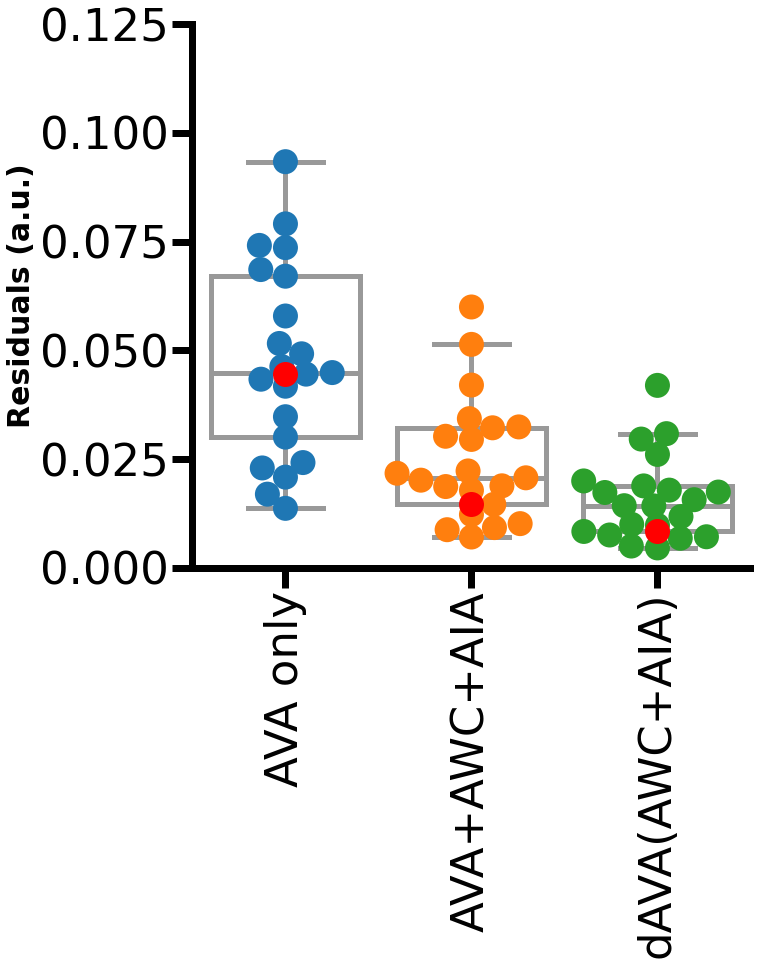

In [301]:
# Here you can plot out the different combos of residual comparisons. 

# Switch between plots of interest here, easier to do this way. Use block above for inputs.
neuron_data = combined_AWC_AIA_AVA_res
neuron_labels = combined_AWC_AIA_AVA_labels
titlename = 'Residuals for AVA-AWC-AIA'

dF_Residuals = pd.DataFrame(neuron_data.T, columns=neuron_labels)
print(dF_Residuals)
colors = sns.color_palette("Pastel1")

fig, ax = plt.subplots(1,1, figsize=(10,10), facecolor='w')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 7
sns.boxplot(data=dF_Residuals, color='white', linewidth = 5)
sns.swarmplot(data=dF_Residuals, size=25)
sns.swarmplot(data=dF_Residuals.loc[[3]], size=25, color='red')
# highlight specific worm index #3 shown in paper (worm #4, but index #3)
# note this duplicates the datapoint, so I just use it to highlight the data
plt.xticks(rotation=90)
ax.set_ylim([0,0.125]) # change 0.125 to 0.150 for AFD due to outlier
plt.yticks(np.arange(0, 0.15, step=0.025))
ax.set_ylabel('Residuals (a.u.)', fontsize=30, weight='bold')
ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
#plt.savefig(titlename + '.svg') 


In [302]:
## Color-coding stimuli pulses ##

# There are 3 stimuli delivered in the NeuroPAL experiments, and they are delivered in a semi-randomized order 
# between the 21 worms. This is detailed in their dataset under dataset['stims']. To visualize the different 
# stimuli, I went through and color-coded them for plotting later. I chose colors close to their paper.

print(mat1['stims']) # this is how they labeled their stims and their orders

# 1 = 2-butanone (attractive odor) = darksalmon
# 2 = 2,3-pentanedione (attractive odor) = mediumpurple
# 3 = NaCl (aversive taste) = yellow

color1 = []
color2 = []
color3 = []

for i in mat1['stims']:
    if i[0] == 1:
        color1.append('darksalmon')
    if i[0] == 2:
        color1.append('mediumpurple')
    if i[0] == 3:
        color1.append('yellow')
        
    if i[1] == 1:
        color2.append('darksalmon')
    if i[1] == 2:
        color2.append('mediumpurple')
    if i[1] == 3:
        color2.append('yellow')
        
    if i[2] == 1:
        color3.append('darksalmon')
    if i[2] == 2:
        color3.append('mediumpurple')
    if i[2] == 3:
        color3.append('yellow')

print('Done')

[[2 1 3]
 [2 1 3]
 [2 1 3]
 [2 1 3]
 [2 1 3]
 [3 2 1]
 [3 2 1]
 [3 2 1]
 [3 2 1]
 [3 2 1]
 [3 2 1]
 [3 2 1]
 [1 3 2]
 [1 3 2]
 [1 3 2]
 [1 3 2]
 [1 3 2]
 [2 1 3]
 [1 3 2]
 [1 3 2]
 [2 1 3]]
Done


/var/folders/h2/nr_g6r3s37v0y4h9l4yjz0bw0000gn/T/ipykernel_44610/2983104670.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(15,10), facecolor='w')


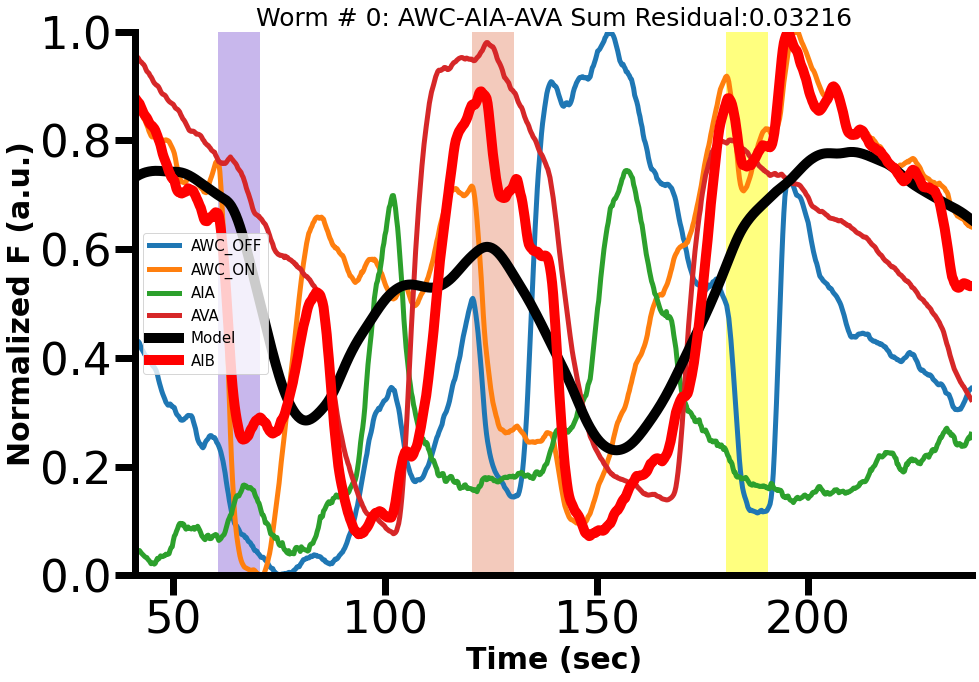

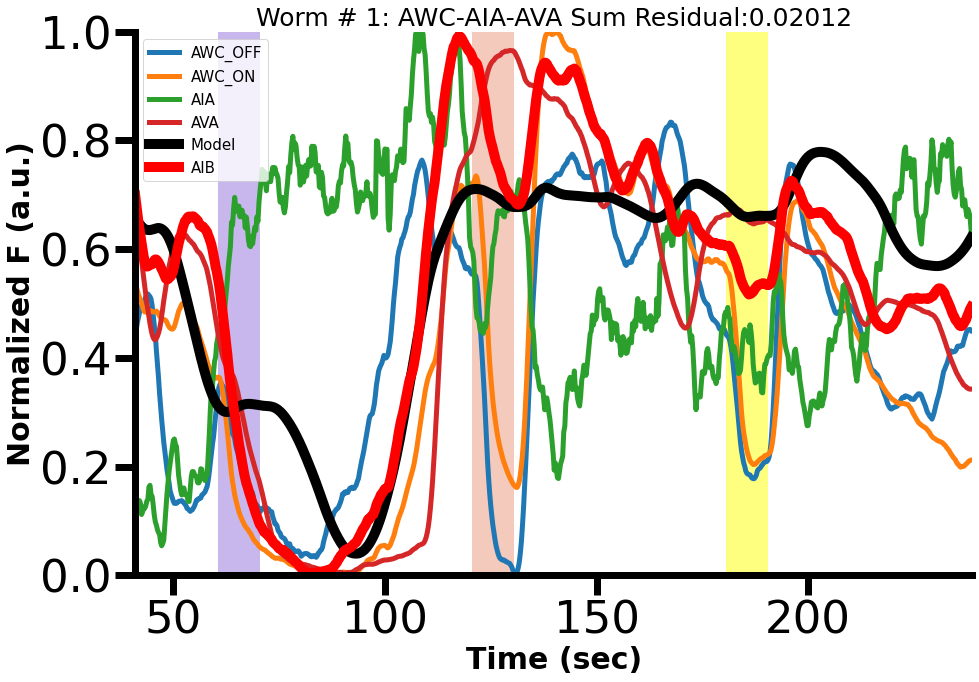

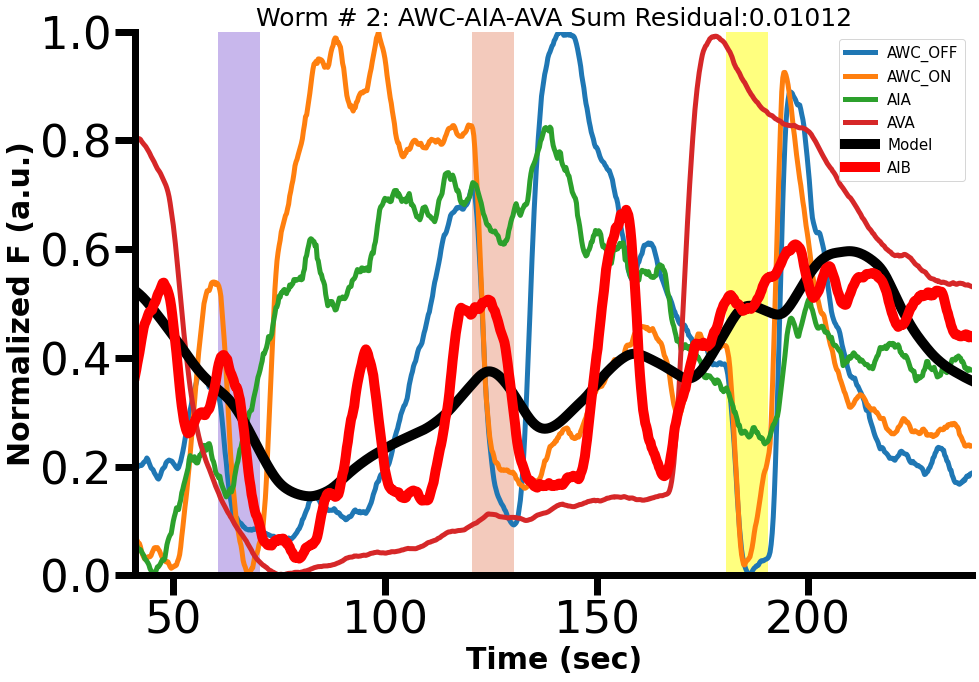

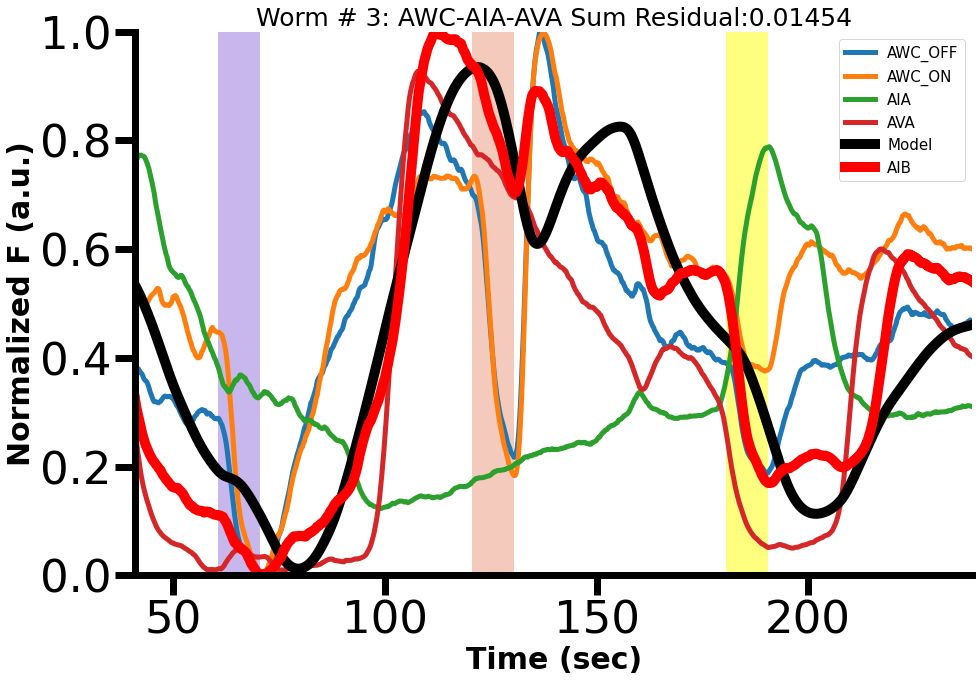

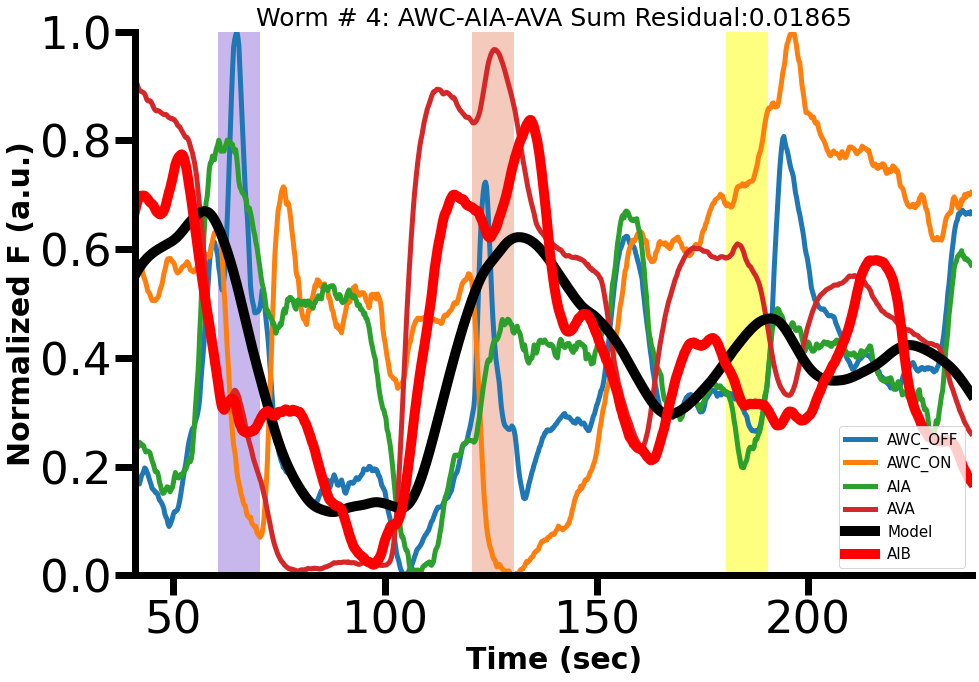

...

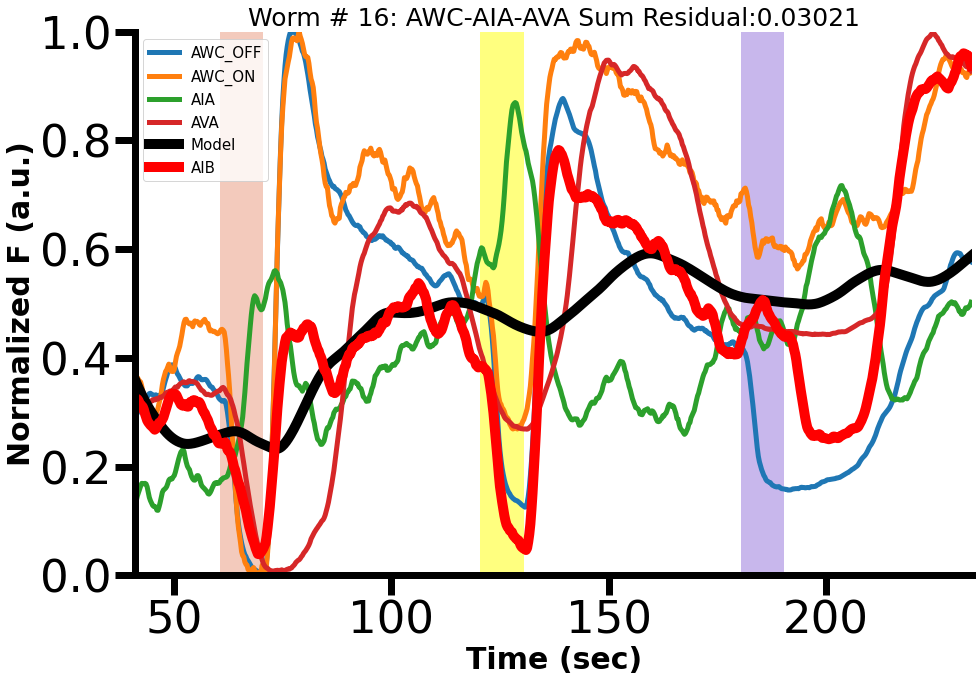

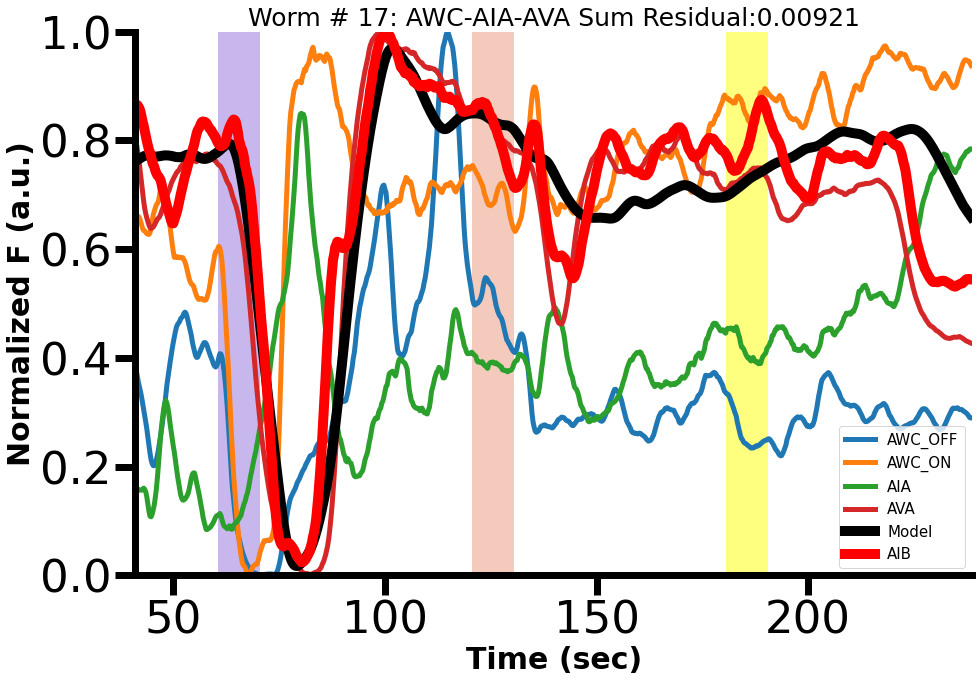

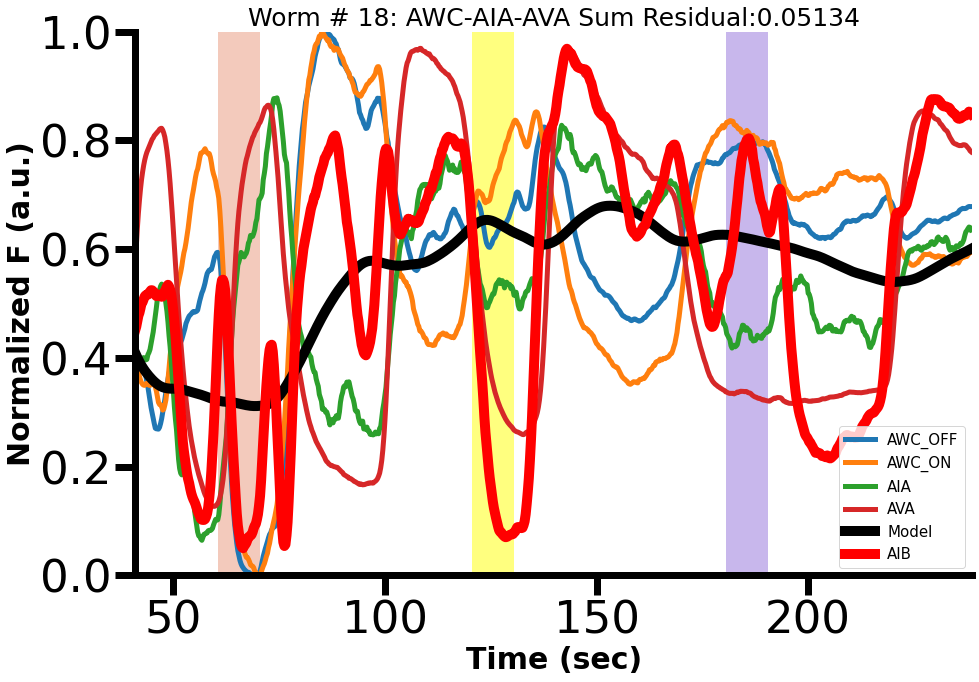

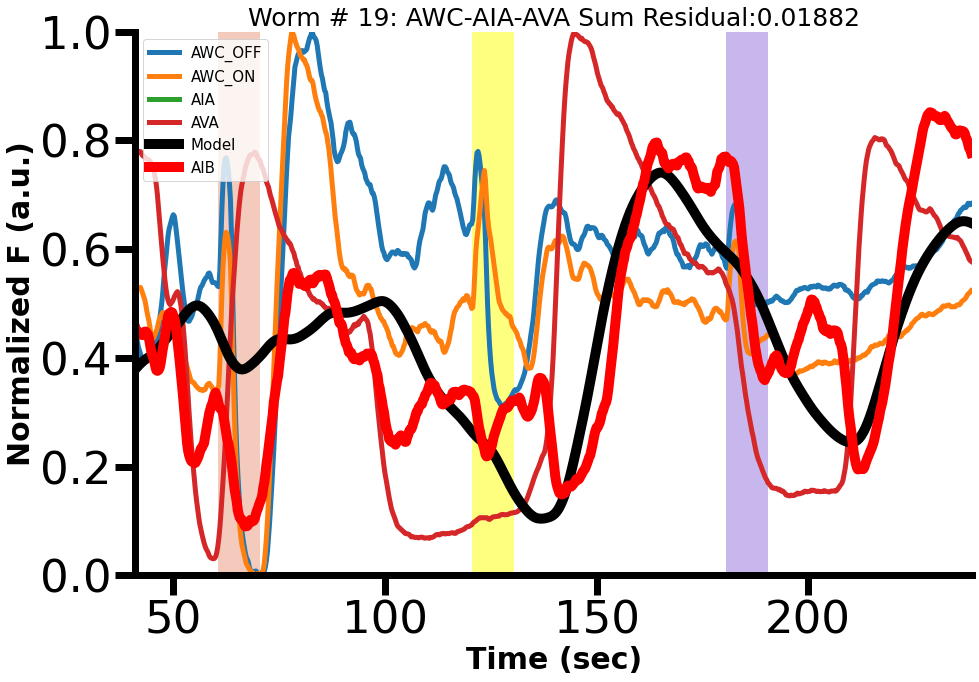

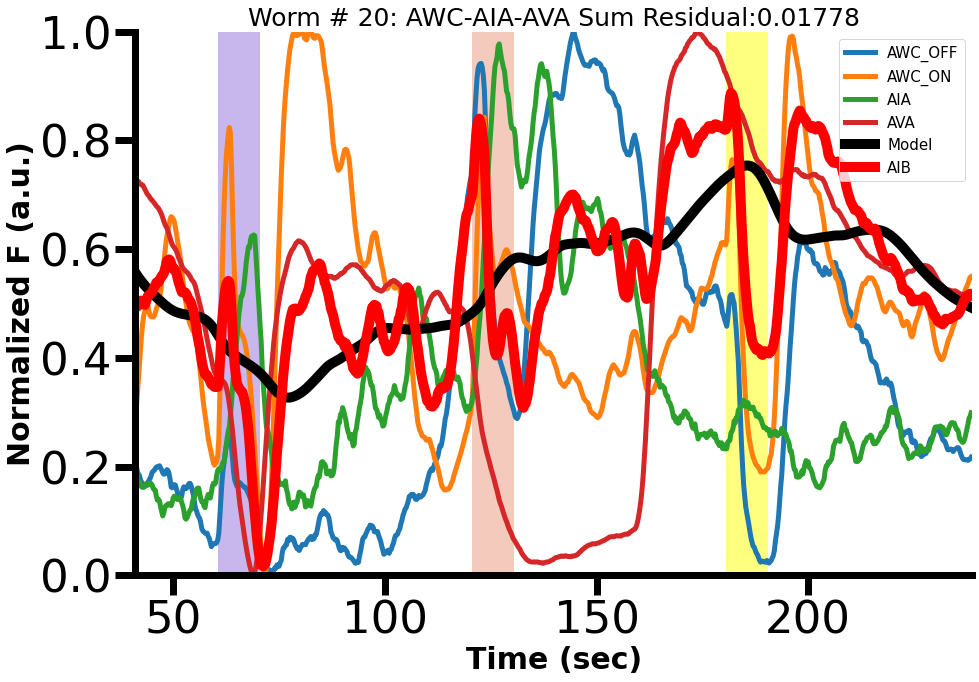

In [227]:
## - Plotting Traces and Model - ##

# Use this to plot single neuron (ie AVA- or RIM-Only), summation, or derivative models
# Use above variables to plot (example shown below for AVA-AWC-AIA network)

# NOTE: if you use single neuron or summation models, make sure to change shift to 0,
# If using derivative model, make sure to change shift to 10

# Easier to change between worms/exps this way
worm_num = 21
residual_plot = AWC_AIA_AVA_sum_res
model_plot = AWC_AIA_AVA_sum_models
aib_plot = AIB_both 
neurons = AWC_AIA_AVA 
names = AWC_AIA_AVA_name # if you want to plot just one neuron, like AVA or RIM, just type ['neuron']
title_name = 'AWC-AIA-AVA Sum'

# Numbers here add shift to match dAVA modeling (truncated by 10 frames at beginning and end)
shift = 0 # 0 if not using derivative model data, 10 if using derivative model data

"""
Another usage example with sensory & RIM models for reference

worm_num = 21
residual_plot = AWC_RIM_sum_res
model_plot = AWC_RIM_sum_models
aib_plot = AIB_both 
neurons = cons_AWC_RIM 
names = cons_AWC_RIM_name
title_name = 'AWC RIM sum'
"""

# This is to plot in seconds (4 fps). Sort of complicated, but normalization cuts off 65 frames in beginning, 
# and convolution process cuts off an additional 99 frames (time window - 1) in beginning, totaling 791 frames. 
# See below for more details.
# This is all just for publication and for transparency of where the ACTUAL time starts in the raw traces.
# Feel free to change to time that makes more sense lol :) 

mod_trunc = 100-1 # 100 is time window of kernel, model truncates data by kernel-1 during convolution
shortened = mod_trunc + shift # if using sum model, no shift added; if using derivative model, adding 10 
short_sec = shortened/4 # 4 fps

for i in range(worm_num):
    if i == 16:
        add_on = 20 # this worm specifically has 20 less frames, so add some padding
    else:
        add_on = 0
        
    timeplot = []
    for t in range((65+shortened),(960-shift-5-add_on)): 
        # 65 is how many frames we cut off in beginning for normalization
        # 960 is true full length of most arrays (before normalization)
        # shortened will cut off data in beginning further to accomodate convolution loss from modeling
        # shift depends on if summation or derivative model (10 less at end for derivative)
        # 5 is how many we lost from smoothing at the end
        # add_on is padding for worm 16, otherwise will be 0
        temp = t/4 # 4 fps
        timeplot.append(temp)
        
    fig, ax = plt.subplots(1,1, figsize=(15,10), facecolor='w') 
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 7
    ax.set_title('Worm # '+str(i) + ': '+ title_name + ' Residual:'+str(residual_plot[i])[:7], fontsize=25)
    if len(names) == 1:
        ax.plot(timeplot, neurons[i][shortened:890-shift-add_on], linewidth=5, alpha=1, label=str(names)) 
    else:
        for n in range(len(names)):
            ax.plot(timeplot, neurons[n][i][shortened:890-shift-add_on], linewidth=5, alpha=1, label=str(names[n])) 
    # Because some traces have different lengths or may have nans padded at the end, the convolution produces
    # zeros (usually occurs at end). For plotting purposes, I replace them with nans here so they don't get plotted
    for z in range(len(model_plot[i])):
        if model_plot[i][z] == 0:
            model_plot[i][z] = np.nan
    ax.plot(timeplot, model_plot[i], color = 'black', linewidth=10, label='Model')
    ax.plot(timeplot, aib_plot[i][shortened:890-shift-add_on], color = 'red', linewidth=10, alpha=1, label='AIB') 
    ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
    ax.set_ylabel('Normalized F (a.u.)', fontsize=30, weight='bold')
    ax.set_xlabel('Time (sec)', fontsize=30, weight='bold')
    ax.set_ylim([0,1])
    ax.set_xlim([16.25+short_sec,(238.75-(add_on/4))]) 
    # 16.25 in seconds is 65 frames (4fps), which is how many frames we cut off for normalization earlier
    # add any additional shift (short_sec) from modeling loss
    # subtract any add_on that happens (from worm 16 specifically)
    ax.axvspan(60.5, 70.5, facecolor=color1[i], alpha = 0.5) # times to highlight stimuli
    ax.axvspan(120.5, 130.5, facecolor=color2[i], alpha = 0.5) # times based on README documentation
    ax.axvspan(180.5, 190.5, facecolor=color3[i], alpha = 0.5) # colors determined in code block above
    ax.legend(loc='best', fontsize=15)
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    #plt.savefig(title_name + ' traces.svg')

/var/folders/h2/nr_g6r3s37v0y4h9l4yjz0bw0000gn/T/ipykernel_44610/1664305340.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(10,10), facecolor='w')


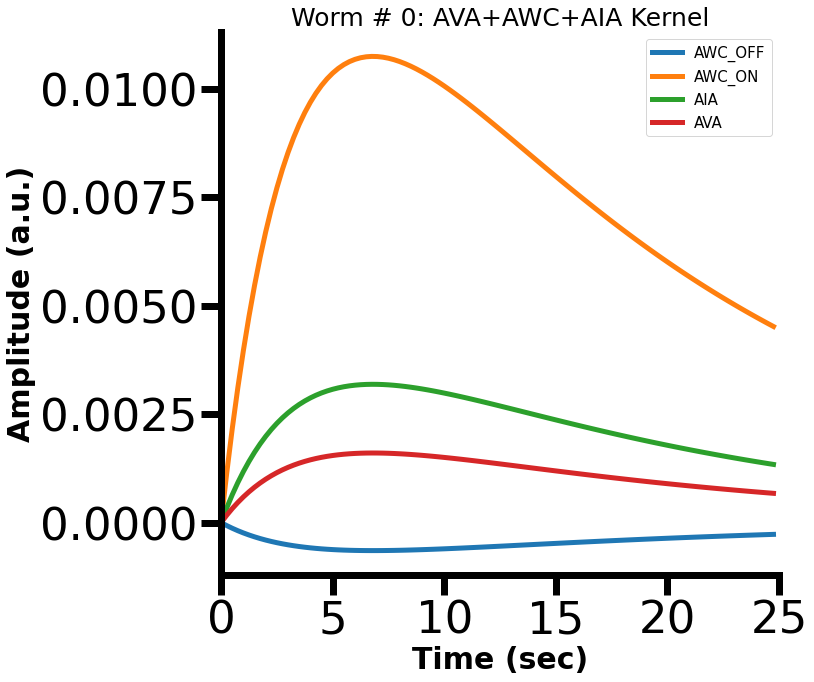

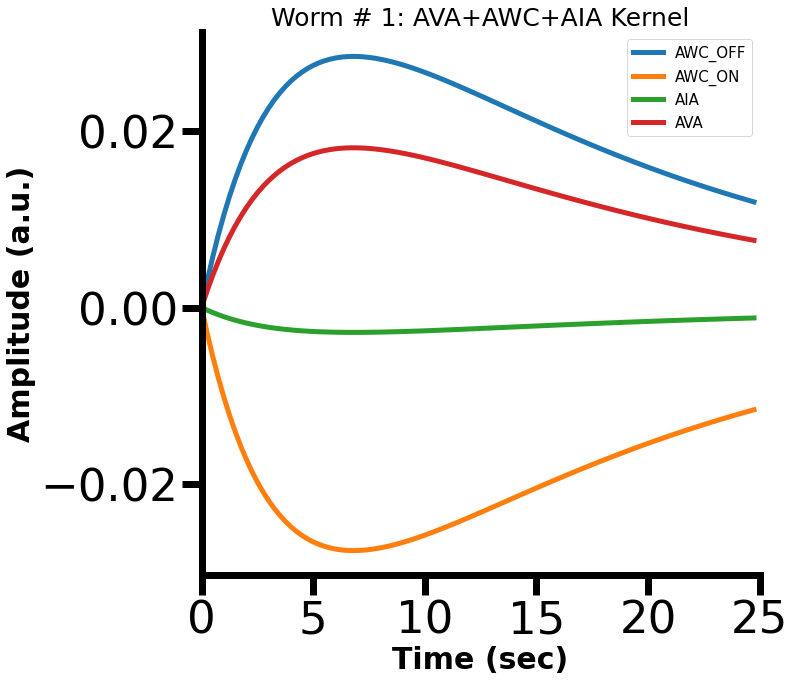

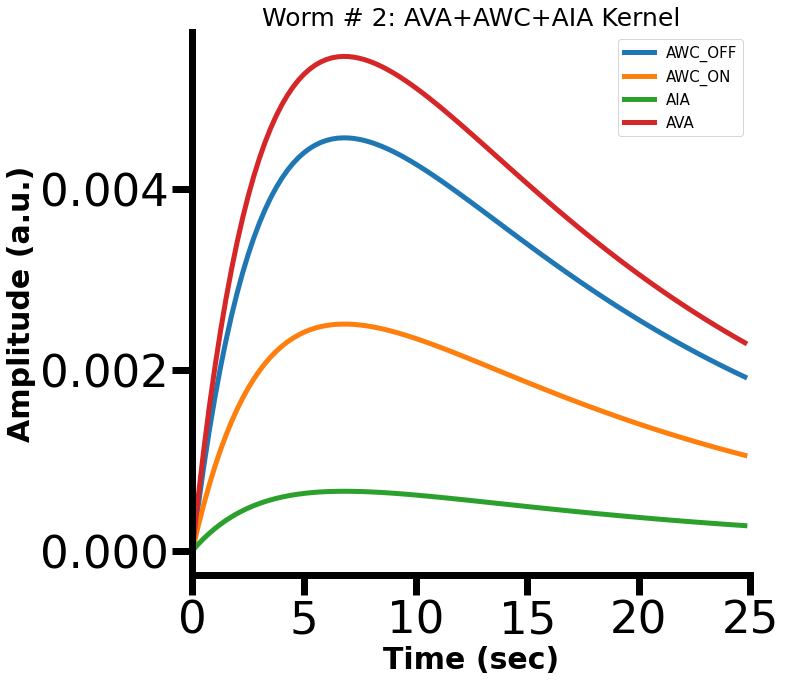

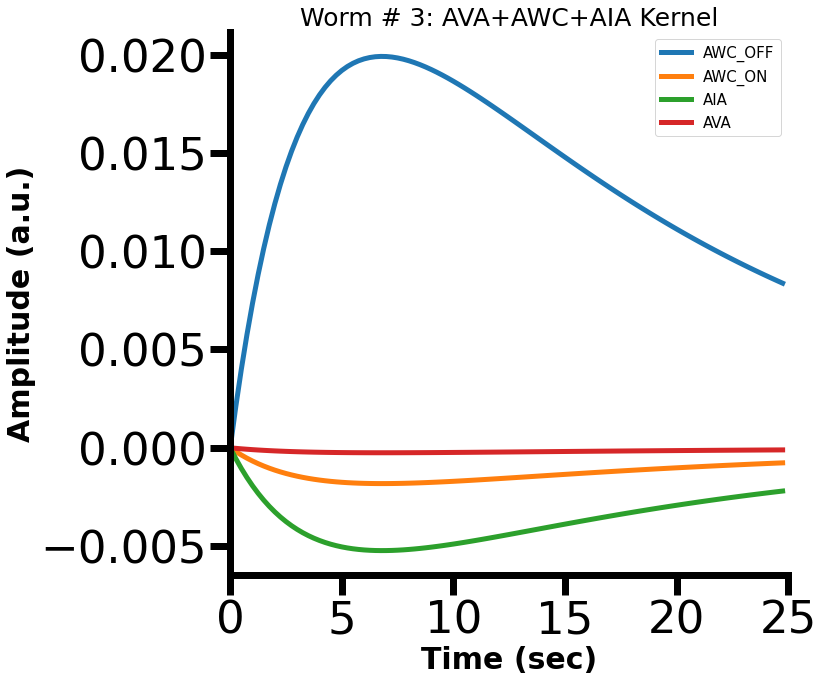

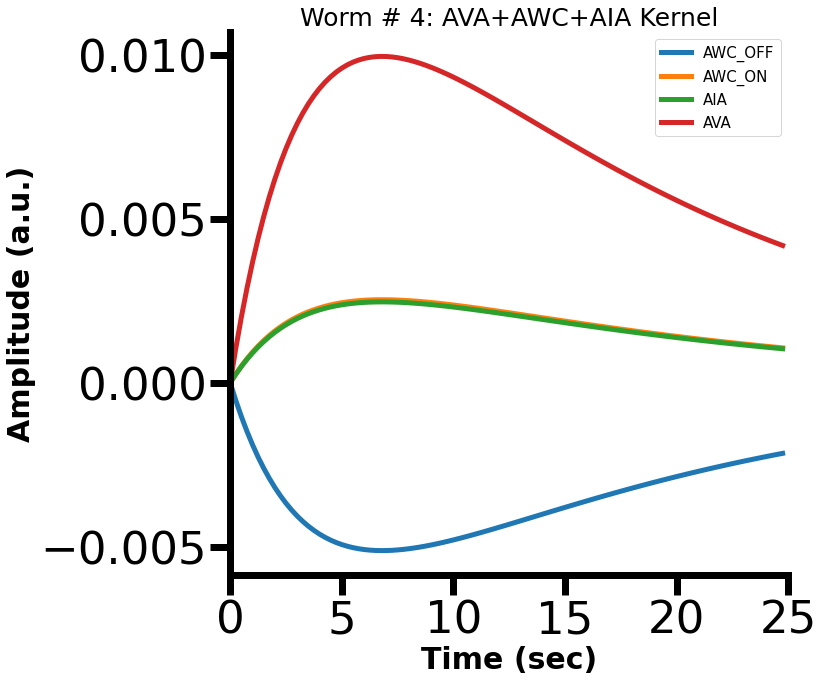

...

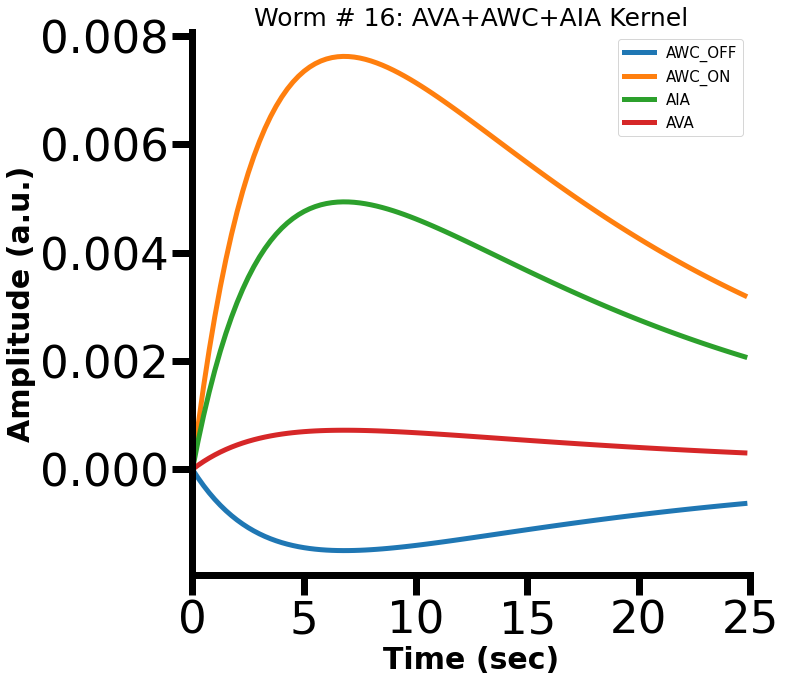

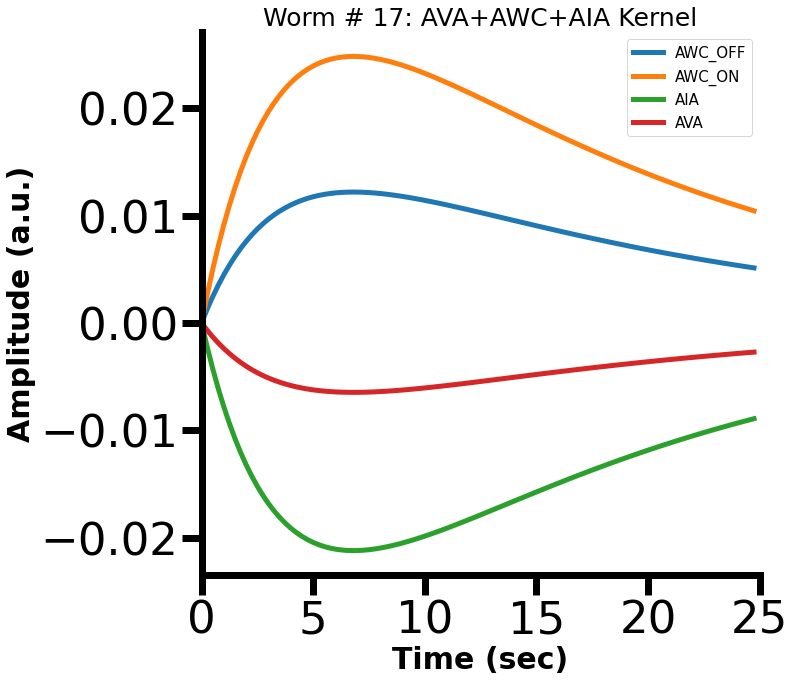

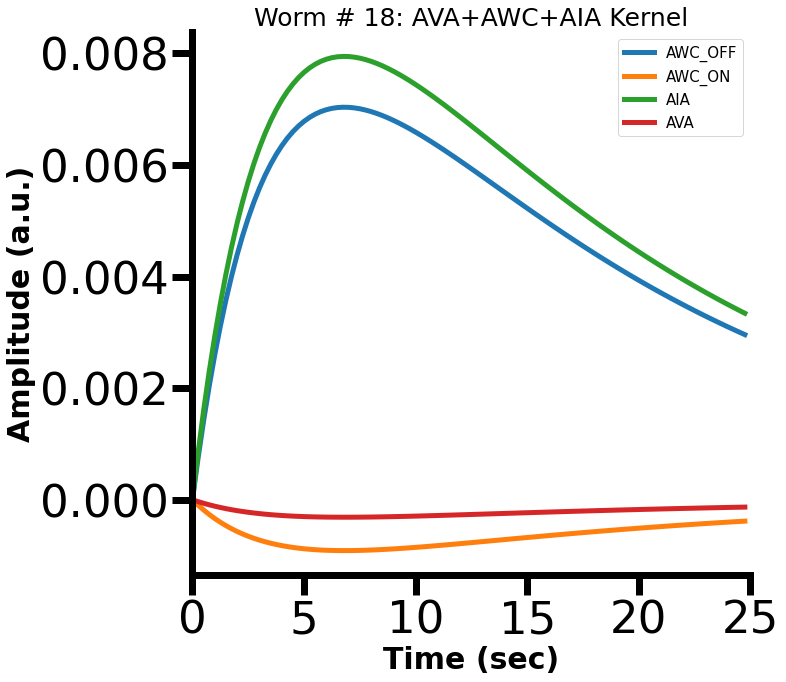

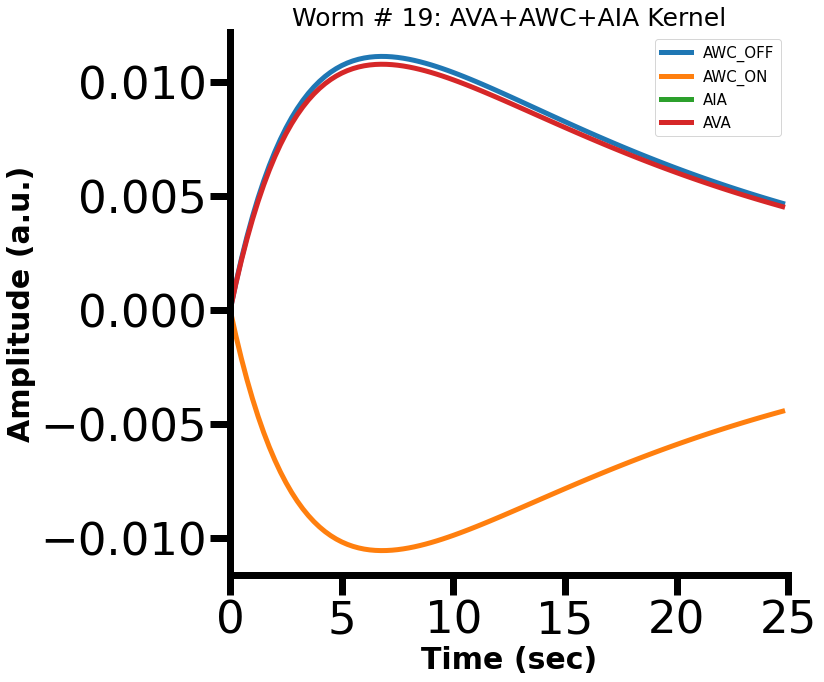

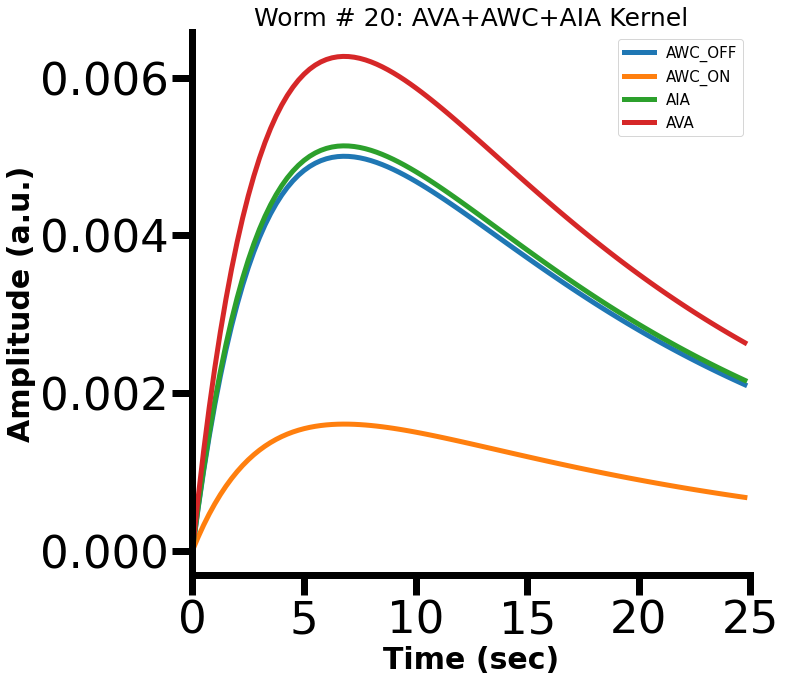

In [257]:
## - Plotting Kernels - ##

# Use this to plot kernels for single-neuron (AVA- or RIM-only) or summation models. Will not work with 
# derivative models. See next code block to plot derivative model params.

# Note, if a neuron trace was missing, remember we made corresponding parameters nans. This way, they won't get
# plotted below.

# Easier to switch between plots this way
worm_num = 21
title_name = 'AVA+AWC+AIA'
names = AWC_AIA_AVA_name # if want to do single neuron (ie AVA or RIM), just write ['neuron']
amps_plot = AWC_AIA_AVA_sum_amps_T

alpha1 = med_AVA_alpha1
alpha2 = med_AVA_alpha2
# these are the median values, don't need to loop (below)
# if you want to plot alpha values (not medians) from single-neuron model (AVA- or RIM- only),
# change to AVA_ RIM_alpha 1 or 2, and make sure to loop below (alpha1[i] and alpha2[i])

"""
Another usage example with sensory & RIM models for reference

worm_num = 21
title_name = 'AWC and RIM'
names =  cons_AWC_RIM_name 
amps_plot = AWC_RIM_sum_amps_T

alpha1 = med_AVA_alpha1
alpha2 = med_AVA_alpha2
"""

# Kernel time window is 100 frames (25 seconds, 4fps) -- much more straightforward than above lol 
time = 100
timeplot_k = np.arange(0, (time/4), 0.25)
t = np.arange(0, time)

for i in range(worm_num):
    fig, ax = plt.subplots(1,1, figsize=(10,10), facecolor='w')
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 7
    ax.set_title('Worm # '+str(i) + ': '+ title_name + ' Kernel', fontsize=25)
    if len(names) == 1:
        kernel = amps_plot[i] * (np.exp(-alpha1*t) - np.exp(-alpha2*t))
        ax.plot(timeplot_k, kernel, linewidth =5, alpha=1, label = str(names))
    else:
        for k in range(len(names)):
            kernel = amps_plot[k][i] * (np.exp(-alpha1*t) - np.exp(-alpha2*t))
            ax.plot(timeplot_k, kernel, linewidth =5, alpha=1, label = str(names[k]))
    ax.set_ylabel('Amplitude (a.u.)', fontsize=30, weight='bold')
    ax.set_xlabel('Time (sec)', fontsize=30, weight='bold')
    ax.tick_params(axis= 'both', labelsize=45, length=20, width=7)
    ax.set_xlim([0,25])
    plt.xticks(np.arange(0, 30, step=5))
    #ax.set_ylim([-0.02,0.03])
    #plt.yticks(np.arange(0, 0.025, step=0.005))
    ax.legend(loc='best', fontsize=15)
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    #plt.savefig(title_name + ' kernels.svg')



/var/folders/h2/nr_g6r3s37v0y4h9l4yjz0bw0000gn/T/ipykernel_44610/1725898061.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(1,1, figsize=(15,10), facecolor='w')


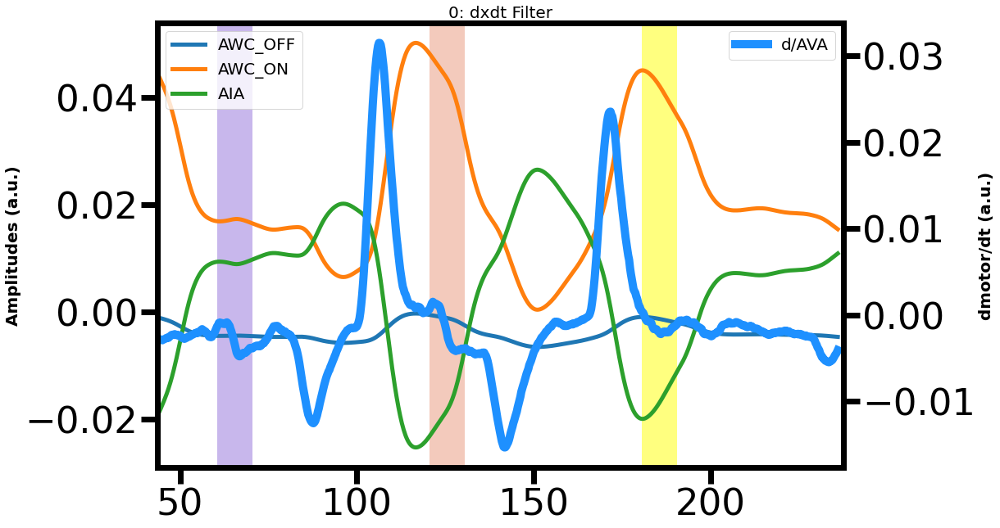

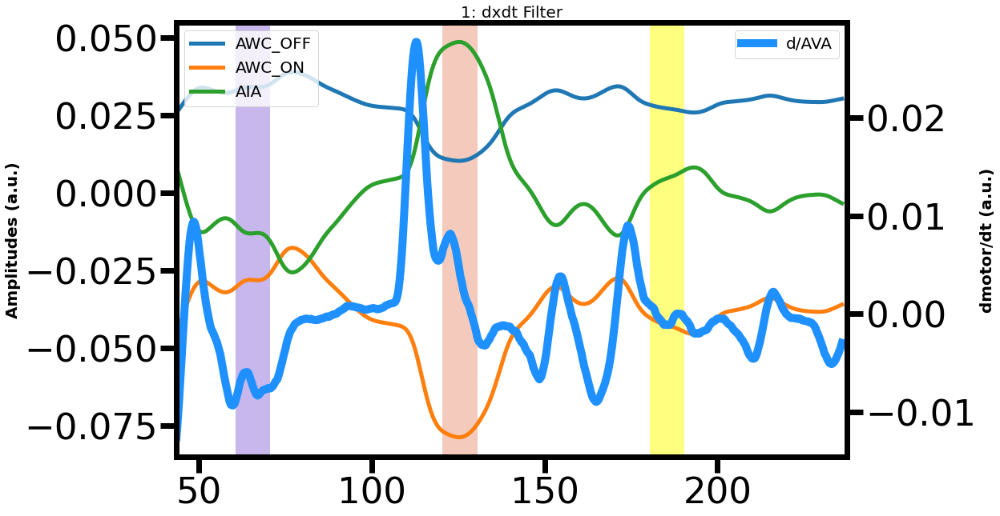

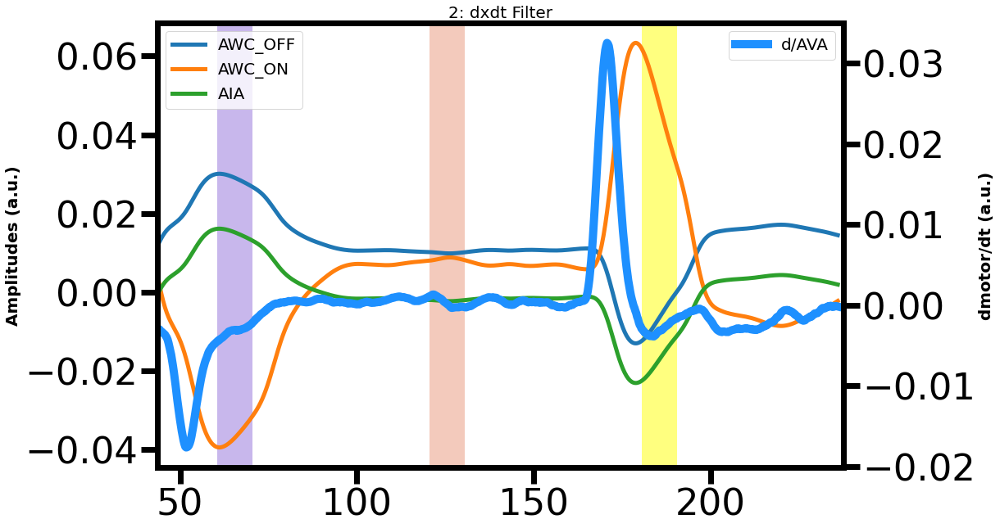

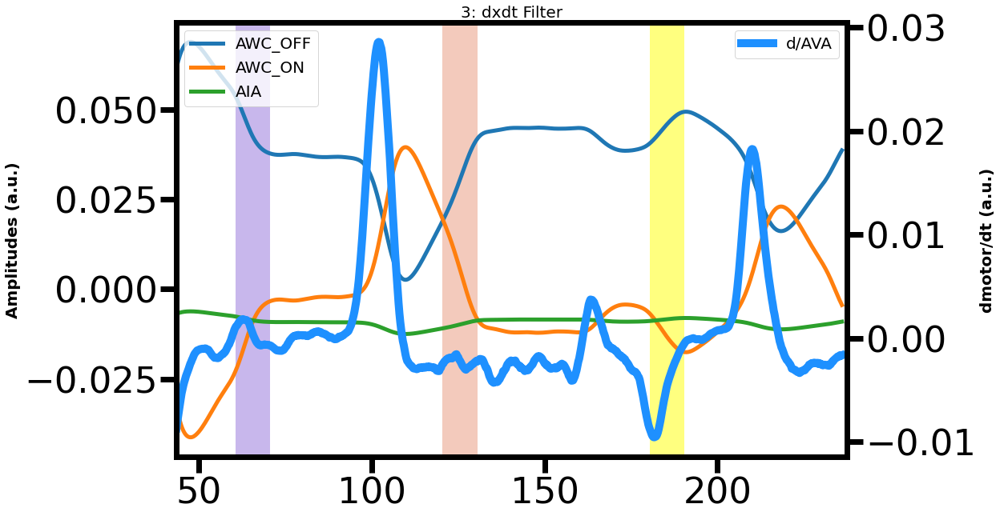

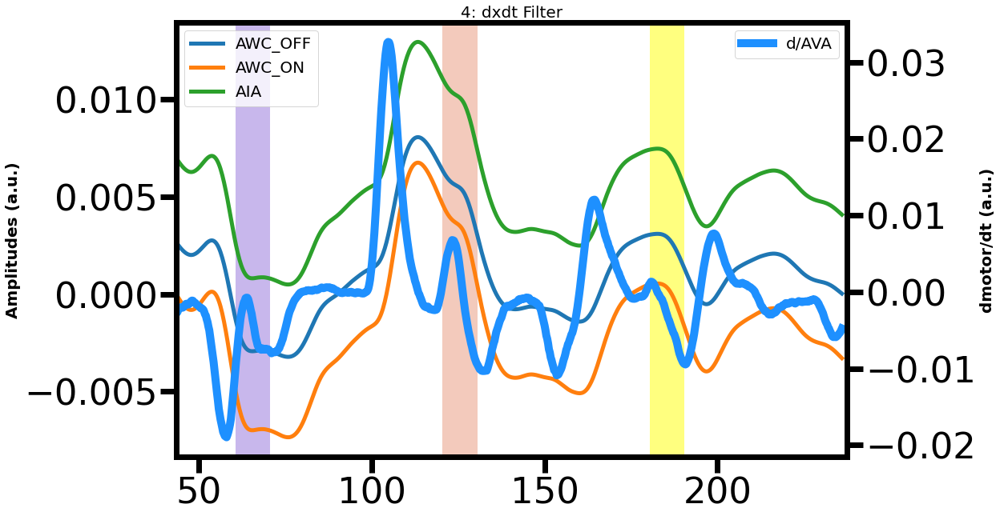

...

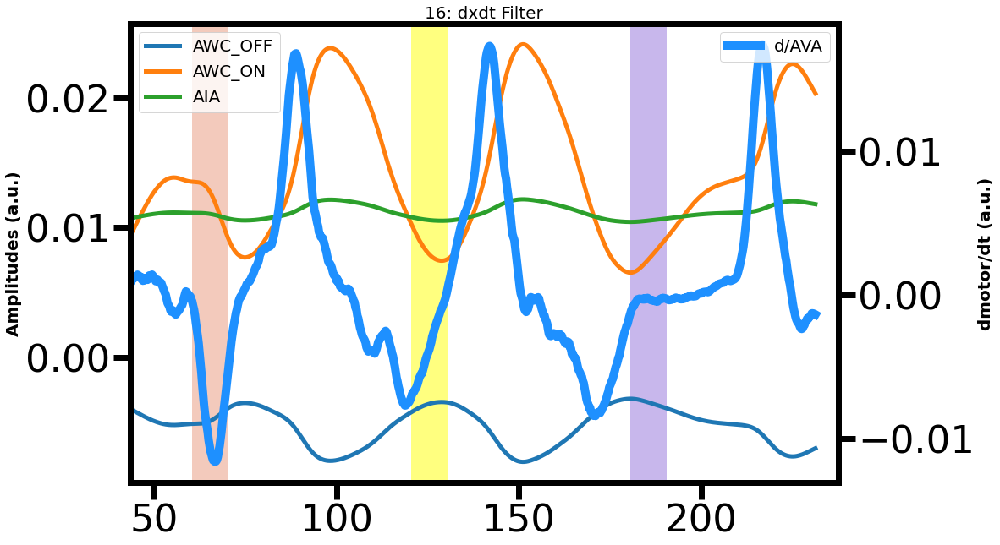

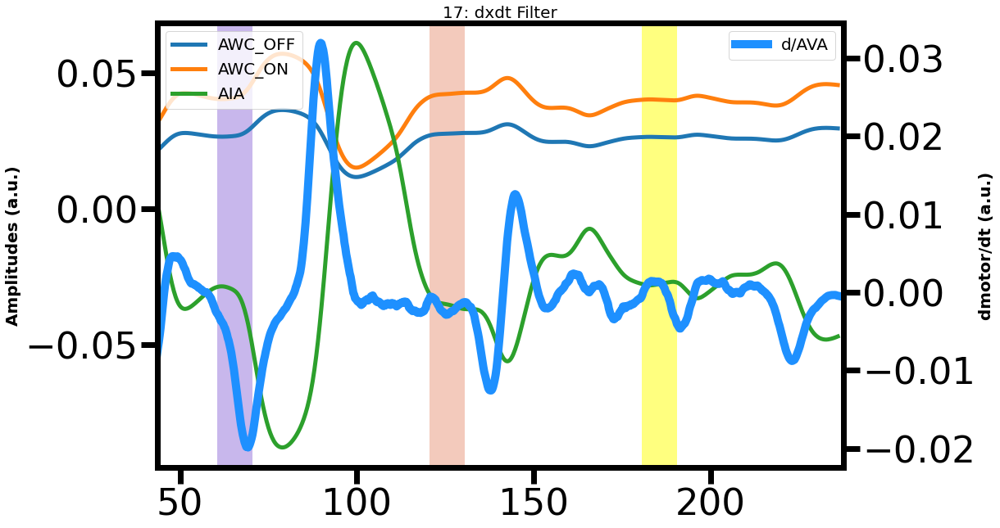

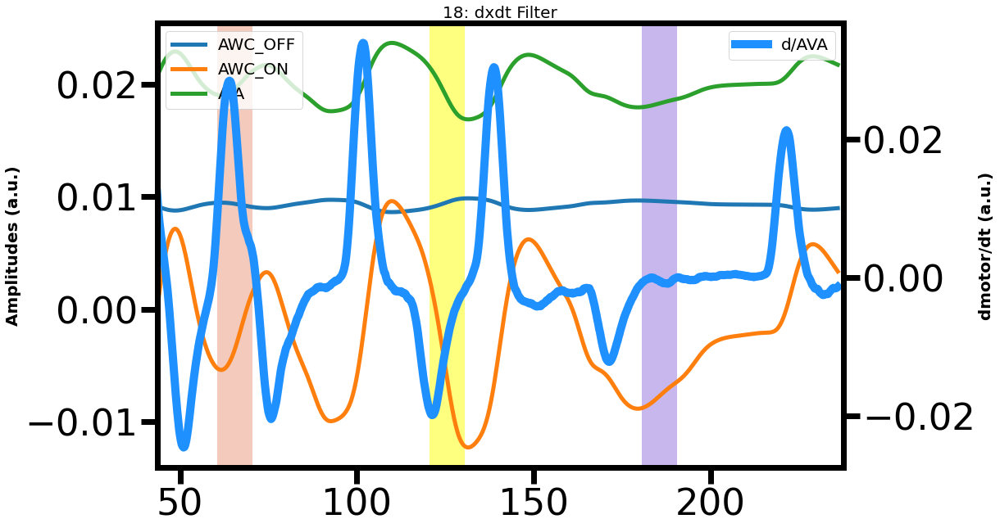

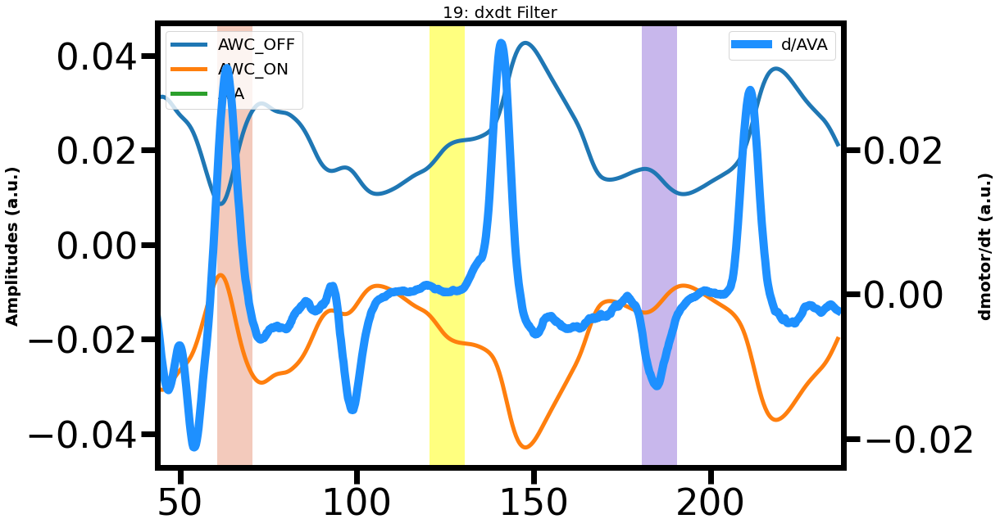

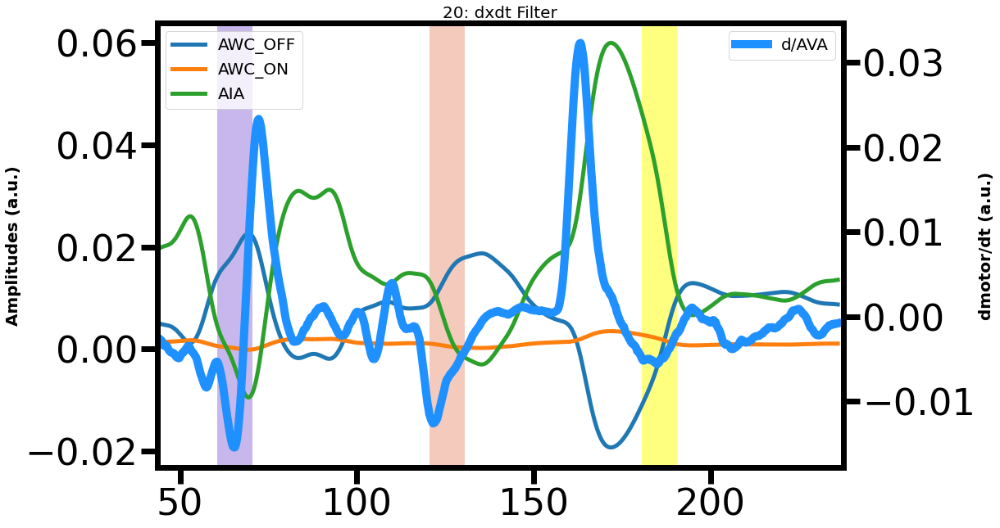

In [307]:
## - Plotting - Amplitude filters - ##

# Use this to plot parameters from the derivative models. Will not work with single-neuron or summation models.

# This is basically what the non-motor amplitudes look like as they're being convolved with dMotor/dt.
# These would be the resulting fits shown for each amplitude. They represent the non-motor inputs (sensory or
# interneuron) as they're being filtered by motor (here, AVA or RIM) changes in activity (represented by derivative)

# Note, remember if a trace is missing, we saved their corresponding amp/offset as a nan so they don't get plotted

# makes it easier to switch plotting between experiments
worm_num = 21
non_motor_names = AWC_AIA_name
motor_names = ['AVA']
nm_amps = AWC_AIA_AVA_dx_amps
nm_offsets = AWC_AIA_AVA_dx_offsets
dx_mot = dAVA
title_name = 'AWC-AIA'

"""
Another usage example with sensory + RIM models - make sure matches inputs you provide to derivative models
Also be mindful of whether a sensory neuron is L and R separately or combined into one. Code might yell at you 
if you input wrong version to help you figure it out too (will say something like out of bounds if too many inputs,
or cannot broadcast together if too little inputs)

worm_num = 21
non_motor_names = ['AWC_OFF', 'AWC_ON'] # make sure you pay attention here if combined input (neuron_both) or separate 
motor_names = ['RIM']
nm_amps = AWC_RIM_dx_amps
nm_offsets = AWC_RIM_dx_offsets
dx_mot = dRIM
"""

short = 100-1 # kernel time window is 100
short_dx = short + 10
short_sec = short_dx/4
timeplot = []
for e in range((65+short_dx),(960-10-5-add_on)): 
    tempt = e/4
    timeplot.append(tempt)

for i in range(worm_num):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10), facecolor='w')
    ax2 = ax1.twinx()
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 7
    ax1.set_title(str(i)+': dxdt Filter', fontsize=20)
    ax2.plot(timeplot, dx_mot[i][short:870-add_on], color='dodgerblue', linewidth = 10, alpha=1, label='d/'+str(motor_names[0])) 
    if len(non_motor_names) == 1: 
        kernel_sens =  nm_amps[i] * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
        sensory_amp = np.convolve(dx_mot[i][:870-add_on], kernel_sens, 'same') + nm_offsets[i]
        ax1.plot(timeplot, sensory_amp[50:870-49-add_on], linewidth = 5, alpha=1, label = str(non_motor_names[0]))
        # convolution 'same' method cuts off half of kernel length at beginning and half at end 
        # 50 and 49 = time-1 (99) 
    else:
        for p in range(len(non_motor_names)):    
            kernel_sens =  nm_amps[i][p] * (np.exp(-med_AVA_alpha1*t) - np.exp(-med_AVA_alpha2*t))
            sensory_amp = np.convolve(dx_mot[i][:870-add_on], kernel_sens, 'same') + nm_offsets[i][p]
            ax1.plot(timeplot, sensory_amp[50:870-49-add_on], linewidth = 5, alpha=1, label = str(non_motor_names[p]))
    ax1.legend(loc='upper left', fontsize=20)
    ax2.legend(loc='upper right', fontsize=20)
    ax2.tick_params(axis= 'both', labelsize=45, length=20, width=7)
    ax1.tick_params(axis= 'both', labelsize=45, length=20, width=7)
    ax2.set_ylabel('dmotor/dt (a.u.)', fontsize=20, weight='bold')
    ax1.set_ylabel('Amplitudes (a.u.)', fontsize=20, weight='bold')
    ax2.set_xlim([16.25+short_sec,(237.5-(add_on/4))]) 
    #ax1.set_ylim([-0.1, 0.1]) 
    #ax2.set_ylim([-0.01, 0.03])
    ax1.axvspan(60.5, 70.5, facecolor=color1[i], alpha = 0.5)
    ax1.axvspan(120.5, 130.5, facecolor=color2[i], alpha = 0.5) 
    ax1.axvspan(180.5, 190.5, facecolor=color3[i], alpha = 0.5)
    ax2.set_xlabel('Time (sec)', fontsize=30, weight='bold')
    #plt.savefig(title_name + ' dxdt filters.svg')


In [57]:
## Making every pairwise combo ##
# This makes it easier to run stats

def Combos(samples, names):
    sample1 = []
    sample1_name = []
    sample2 = []
    sample2_name = []
    
    for i in range(len(names)):
        for j in range(len(names)):
            try:
                if names[i] == names[i+j]: # don't save combo if they're the same name
                    pass
                else:
                    sample1.append(samples[i])
                    sample2.append(samples[i+j])
                    sample1_name.append(names[i])
                    sample2_name.append(names[i+j])
                    #print(names[i], names[i+j])
            except:
                continue
                
    return sample1, sample2, sample1_name, sample2_name


In [58]:
## Statistics for Residuals ##

# This was copied from the other notebooks provided. I guess for stats with this dataset, it's all paired
# (use wilcoxon), but I left the mann-whitney stat usage here too.

from scipy.stats import mannwhitneyu # mann-whitney U is for unpaired samples
from scipy.stats import wilcoxon # wilcoxon is for paired samples
# NOTE: wilcoxon won't work if the difference between samples is 0

import statsmodels.stats.multitest as multi
## Holm-Bonferroni Correction of Residuals ##
# This is a multiple comparison test between all p-values to correct for any potential statistical errors and
# false significance. This returns new, adjusted p-values based on the provided group of tests
# Bonferroni is a more stringent test, and Holm is a variation that is more tailored to your data.

def Stats_model(choice, combos):
    sample1 = combos[0]
    sample2 = combos[1]
    name1 = combos[2]
    name2 = combos[3]
    
    pvals = []
    
    for i in range(len(sample1)):
    
        if choice == 'wilcoxon':
            try:
                diff = np.round(sample1[i]-sample2[i], decimals=2) # suggested by scipy.wilcoxon documentation
                w = wilcoxon(diff)
                p = w.pvalue
                pvals.append(p)
            except: 
                print(name1[i],' vs ', name2[i], ': diff is zero! - NS')
                pvals.append(np.nan)
                continue

        if choice == 'mannwhitney':   
            U, p = mannwhitneyu(sample1[i], sample2[i])
            pvals.append(p)

    # holm-bonferroni correction
    hb_corr = multi.multipletests(pvals, alpha=0.05, method='holm', is_sorted=False, returnsorted=False)
    
    for j in range(len(sample1)):
        p1 = pvals[j] # display p-values (not corrected)
        if p1 < 0.001:
            stars1 = '*** '
        elif p1 < 0.01:
            stars1 = '** '
        elif p1 < 0.05:
            stars1 = '* '
        elif p1 > 0.05:
            stars1 = 'NS '
            
        p2 = hb_corr[1][j]
        if p2 < 0.001: # display holm-bonferroni corrected p-values
            stars2 = '*** '
        elif p2 < 0.01:
            stars2 = '** '
        elif p2 < 0.05:
            stars2 = '* '
        elif p2 > 0.05:
            stars2 = 'NS '
        print(name1[j],' vs ', name2[j], ': ', str(p1)[:7], stars1, ', HB: ', str(p2)[:7], stars2)
        

In [309]:
# Make different pairwise combos for our residuals and run stats on them

print('AVA- vs RIM-only')
AVA_RIM_combos = Combos(compare_AVA_RIM_res, compare_AVA_RIM_res_labels)
AVA_RIM_stats = Stats_model('wilcoxon', AVA_RIM_combos)

print("my network:") 
AWC_AIA_AVA_combos = Combos(combined_AWC_AIA_AVA_res, combined_AWC_AIA_AVA_labels)
AWC_AIA_AVA_stats = Stats_model('wilcoxon', AWC_AIA_AVA_combos)

print("sensory w RIM:")
AWC_RIM_combos = Combos(combined_AWC_RIM_res, combined_AWC_RIM_labels)
AWC_RIM_stats = Stats_model('wilcoxon', AWC_RIM_combos)
print('\n')

ASG_RIM_combos = Combos(combined_ASG_RIM_res, combined_ASG_RIM_labels)
ASG_RIM_stats = Stats_model('wilcoxon', ASG_RIM_combos)
print('\n')

ADF_RIM_combos = Combos(combined_ADF_RIM_res, combined_ADF_RIM_labels)
ADF_RIM_stats = Stats_model('wilcoxon', ADF_RIM_combos)
print('\n')

AFD_RIM_combos = Combos(combined_AFD_RIM_res, combined_AFD_RIM_labels)
AFD_RIM_stats = Stats_model('wilcoxon', AFD_RIM_combos)
print('\n')

ASH_RIM_combos = Combos(combined_ASH_RIM_res, combined_ASH_RIM_labels)
ASH_RIM_stats = Stats_model('wilcoxon', ASH_RIM_combos)
print('\n')

FLPL_RIM_combos = Combos(combined_FLPL_RIM_res, combined_FLPL_RIM_labels)
FLPL_RIM_stats = Stats_model('wilcoxon', FLPL_RIM_combos)

print('Done')


AVA- vs RIM-only
AVA  vs  RIM :  0.06644 NS  , HB:  0.06644 NS 
my network:
AVA only  vs  AVA+AWC+AIA :  0.00058 ***  , HB:  0.00117 ** 
AVA only  vs  dAVA(AWC+AIA) :  0.00018 ***  , HB:  0.00055 *** 
AVA+AWC+AIA  vs  dAVA(AWC+AIA) :  0.00153 **  , HB:  0.00153 ** 
sensory w RIM:
RIM only  vs  AWC+RIM :  0.03314 *  , HB:  0.03314 * 
RIM only  vs  dRIM(AWC) :  0.00061 ***  , HB:  0.00185 ** 
AWC+RIM  vs  dRIM(AWC) :  0.00155 **  , HB:  0.00310 ** 


RIM only  vs  ASG+RIM :  0.25363 NS  , HB:  0.25363 NS 
RIM only  vs  dRIM(ASG) :  0.00084 ***  , HB:  0.00245 ** 
ASG+RIM  vs  dRIM(ASG) :  0.00081 ***  , HB:  0.00245 ** 


RIM only  vs  ADF+RIM :  0.56824 NS  , HB:  0.56824 NS 
RIM only  vs  dRIM(ADF) :  0.00174 **  , HB:  0.00397 ** 
ADF+RIM  vs  dRIM(ADF) :  0.00132 **  , HB:  0.00397 ** 


RIM only  vs  AFD+RIM :  0.47848 NS  , HB:  0.47848 NS 
RIM only  vs  dRIM(AFD) :  0.05746 NS  , HB:  0.11493 NS 
AFD+RIM  vs  dRIM(AFD) :  0.00173 **  , HB:  0.00519 ** 


RIM only  vs  ASH+RIM :  0